<ul>
    <h3><b>CLIENTE: F</b></h3>
    <ul>
            <li> <b>Portifolio (24 meses)</b> </li>
            <li> <b>Processamento Digital de Sinais Financeiros</b> </li>
            <li> <b>Paulo Gontijo.</b> </li>
    </ul>
</ul>

<ul>
<li>Fonte: http://www.bmfbovespa.com.br/pt_br/produtos/indices/</li>
<li>yahoo finance API</li>
</ul>    

In [44]:
%matplotlib notebook 
import matplotlib.dates as mdates
#from matplotlib.finance import candlestick_ohlc
import datetime
from pandas import *
import matplotlib.mlab as mlab
import scipy.signal as signal
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_datareader.data as pdr
import yfinance as yf
import datetime as dt
import matplotlib.ticker as mticker
sns.set()

def yahoo(symbols,S_Day, S_Month, S_Year, E_Day, E_Month, E_Year):
    yf.pdr_override()       
    stocks_yahoo = pdr.get_data_yahoo(symbols, start=datetime(S_Year, S_Month, S_Day), end=datetime(E_Year, E_Month, E_Day),   as_panel = False,)
    return stocks_yahoo

In [45]:
year = 365
months = 365/12
n_months = 24 * months

In [46]:
#index_list = ['2019.09.26 IMOB.xls','2019.09.26 ICON.xls','2019.12.03 IEE.xls','2020.04.03 IBrA.xls'
#              ,'2019.09.26 IFNC.xls','2019.09.26 IVBX 2.xls','2019.12.03 SMLL.xls','2019.09.26 MLCX.xls']
index_list = ['2020.04.03 IBrA2.xls']
melhores_volumes = []

#==================================================================================================#

for names in index_list:
    
    # Leitura do arquivo .xls do indice

    data = pd.read_html(names)[0]['Código']
    data.to_frame()
    data.values
    symbols=list(data.values)

    Stocks=[]
    
    for symbol in symbols:
        if len(symbol)==5:
            Stocks.append(symbol)

    
    Stocks=[Stocks[k]+'.SA' for k in range(len(Stocks))]
    
    # Definicao do periodo de analise

    today      = dt.date.today()
    E_Day      = today.day; E_Month = today.month; E_Year = today.year
    day_before = today - dt.timedelta(n_months)
    S_Day      = day_before.day; S_Month = day_before.month; S_Year = day_before.year

    stocks_all = yahoo(Stocks,S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)

    # Coleta dos volumes 

    stocks_volume = stocks_all['Volume']

    volumes = ['none'] * len(Stocks)

    for i in range(len(Stocks)):
        volumes[i] = stocks_volume[Stocks[i]].sum()
    n_volumes = np.array(volumes)

    # Ordenar volumes em ordem decrescente

    i_volumes = np.asarray(volumes, dtype = int)
    sortd_volumes = np.array(-np.sort(-i_volumes))

    # Nomear os 3 primeiros volumes

    for i in range(len(Stocks)):
        if sortd_volumes[0] == n_volumes[i]:
                melhor = Stocks[i]
                p = melhor

        if sortd_volumes[1] == n_volumes[i]:
                melhor = Stocks[i]
                s = melhor

        if sortd_volumes[2] == n_volumes[i]:
                melhor = Stocks[i]
                t = melhor

        if sortd_volumes[3] == n_volumes[i]:
                melhor = Stocks[i]
                q = melhor

        if sortd_volumes[4] == n_volumes[i]:
                melhor = Stocks[i]
                qui = melhor
                
        if sortd_volumes[5] == n_volumes[i]:
                melhor = Stocks[i]
                sex = melhor
                
        if sortd_volumes[6] == n_volumes[i]:
                melhor = Stocks[i]
                seti = melhor
        
        if sortd_volumes[7] == n_volumes[i]:
                melhor = Stocks[i]
                oit = melhor

        if sortd_volumes[8] == n_volumes[i]:
                melhor = Stocks[i]
                nove = melhor
                
        if sortd_volumes[9] == n_volumes[i]:
                melhor = Stocks[i]
                dez = melhor
                
    print("\n")            
    print('Primeira:', p, '= ', sortd_volumes[0])
    print('Segunda: ', s, '= ', sortd_volumes[1])
    print('Terceira:', t, '= ', sortd_volumes[2])
    print('Quarta:  ', q, '= ', sortd_volumes[3])
    print('Quinta:  ', qui, '= ', sortd_volumes[4])
    print('Sexta:  ', sex, '= ', sortd_volumes[5])
    print('Setima:  ', seti, '= ', sortd_volumes[6])
    print('Oitava:  ', oit, '= ', sortd_volumes[7])
    print('Nona:  ', nove, '= ', sortd_volumes[8])
    print('Decima:  ', dez, '= ', sortd_volumes[9])
    print()

    melhores_volumes.append(p)
    melhores_volumes.append(s)
    melhores_volumes.append(t)
    melhores_volumes.append(q)
    melhores_volumes.append(qui)
    melhores_volumes.append(sex)
    melhores_volumes.append(seti)
    melhores_volumes.append(oit)
    melhores_volumes.append(nove)
    melhores_volumes.append(dez)
    
    

#==================================================================================================#

[*********************100%***********************]  142 of 142 downloaded


Primeira: PETR4.SA =  32474544900
Segunda:  VVAR3.SA =  18287457900
Terceira: ITUB4.SA =  12315553550
Quarta:   ITSA4.SA =  11938469800
Quinta:   BBDC4.SA =  11202972670
Sexta:   VALE3.SA =  10965518500
Setima:   ABEV3.SA =  10958334300
Oitava:   COGN3.SA =  9304248200
Nona:   CIEL3.SA =  8370856000
Decima:   USIM5.SA =  8021780600



In [47]:
stocks_vol = stocks_all.copy()
stocks_vol = stocks_vol['Volume'].mean().sort_values(ascending = False)
stocks_vol

PETR4.SA    6.613960e+07
VVAR3.SA    3.724533e+07
ITUB4.SA    2.508259e+07
ITSA4.SA    2.431460e+07
BBDC4.SA    2.281664e+07
VALE3.SA    2.233303e+07
ABEV3.SA    2.231840e+07
COGN3.SA    1.894959e+07
CIEL3.SA    1.704859e+07
USIM5.SA    1.633764e+07
PETR3.SA    1.465736e+07
BBAS3.SA    1.397309e+07
GGBR4.SA    1.368139e+07
JBSS3.SA    1.275960e+07
GOAU4.SA    1.228386e+07
B3SA3.SA    1.161942e+07
CSNA3.SA    1.155609e+07
MGLU3.SA    1.149607e+07
CMIG4.SA    1.147250e+07
TCSA3.SA    1.091254e+07
IRBR3.SA    1.044265e+07
NTCO3.SA    9.134292e+06
BRML3.SA    8.860805e+06
RAIL3.SA    8.585146e+06
CCRO3.SA    8.301609e+06
MRFG3.SA    7.606118e+06
BRFS3.SA    7.178690e+06
EQTL3.SA    6.808190e+06
SUZB3.SA    6.798597e+06
GOLL4.SA    6.537758e+06
                ...     
SMTO3.SA    1.028663e+06
CPLE6.SA    1.026323e+06
TRIS3.SA    1.016564e+06
DIRR3.SA    9.475344e+05
GUAR3.SA    8.860200e+05
MDIA3.SA    8.715601e+05
SAPR4.SA    7.867391e+05
LOGN3.SA    7.687041e+05
PSSA3.SA    7.661159e+05


In [48]:
# Leitura do arquivo .xls do indice

data = pd.read_html('2019.12.03 IFIX.xls')[0]['Código']
data.to_frame()
data.values
symbols=list(data.values)

Stocks = []
for symbol in symbols:
    if len(symbols)==5:
        Stocks.append(symbol)
    Stocks.append(symbol)
        
Stocks=[Stocks[k]+'.SA' for k in range(len(Stocks))]
Stocks = Stocks[:-2]


# Definicao do periodo de analise

today      = dt.date.today()
E_Day      = today.day; E_Month = today.month; E_Year = today.year
day_before = today - dt.timedelta(n_months)
S_Day      = day_before.day; S_Month = day_before.month; S_Year = day_before.year

stocks_ifix = yahoo(Stocks,S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)

# Coleta dos volumes 

stocks_volume = stocks_ifix['Volume']

volumes = ['none'] * len(Stocks)

for i in range(len(Stocks)):
    volumes[i] = stocks_volume[Stocks[i]].sum()
n_volumes = np.array(volumes)
 
# Ordenar volumes em ordem decrescente

i_volumes = np.asarray(volumes, dtype = int)
sortd_volumes = np.array(-np.sort(-i_volumes))

# Nomear os 3 primeiros volumes

for i in range(len(Stocks)):
    if sortd_volumes[0] == n_volumes[i]:
                melhor = Stocks[i]
                p = melhor

    if sortd_volumes[1] == n_volumes[i]:
            melhor = Stocks[i]
            s = melhor

    if sortd_volumes[2] == n_volumes[i]:
            melhor = Stocks[i]
            t = melhor

    if sortd_volumes[3] == n_volumes[i]:
            melhor = Stocks[i]
            q = melhor

    if sortd_volumes[4] == n_volumes[i]:
            melhor = Stocks[i]
            qui = melhor

    if sortd_volumes[5] == n_volumes[i]:
            melhor = Stocks[i]
            sex = melhor

    if sortd_volumes[6] == n_volumes[i]:
            melhor = Stocks[i]
            seti = melhor

    if sortd_volumes[7] == n_volumes[i]:
            melhor = Stocks[i]
            oit = melhor

    if sortd_volumes[8] == n_volumes[i]:
            melhor = Stocks[i]
            nove = melhor

    if sortd_volumes[9] == n_volumes[i]:
            melhor = Stocks[i]
            dez = melhor

print("\n")            
print('Primeira:', p, '= ', sortd_volumes[0])
print('Segunda: ', s, '= ', sortd_volumes[1])
print('Terceira:', t, '= ', sortd_volumes[2])
print('Quarta:  ', q, '= ', sortd_volumes[3])
print('Quinta:  ', qui, '= ', sortd_volumes[4])
print('Sexta:  ', sex, '= ', sortd_volumes[5])
print('Setima:  ', seti, '= ', sortd_volumes[6])
print('Oitava:  ', oit, '= ', sortd_volumes[7])
print('Nona:  ', nove, '= ', sortd_volumes[8])
print('Decima:  ', dez, '= ', sortd_volumes[9])
print()

melhores_volumes.append(p)
melhores_volumes.append(s)
melhores_volumes.append(t)
melhores_volumes.append(q)
melhores_volumes.append(qui)
melhores_volumes.append(sex)
melhores_volumes.append(seti)
melhores_volumes.append(oit)
melhores_volumes.append(nove)
melhores_volumes.append(dez)


[*********************100%***********************]  93 of 93 downloaded


Primeira: MXRF11.SA =  102346299
Segunda:  CARE11.SA =  75320811
Terceira: FLMA11.SA =  31014394
Quarta:   KNCR11.SA =  23525087
Quinta:   XPML11.SA =  23523744
Sexta:   BRCR11.SA =  21923242
Setima:   XPLG11.SA =  18184036
Oitava:   KNRI11.SA =  16775274
Nona:   VISC11.SA =  16735621
Decima:   HGLG11.SA =  14242025



In [49]:
all_names= []
frames = [stocks_all, stocks_ifix]
total_stocks = pd.concat(frames)
indexes = total_stocks['Adj Close'].dropna().transpose().index

for i in range(0, len(indexes)):
    all_names.append(total_stocks['Adj Close'].dropna().transpose().index[i])
    
all_names

['ABCB4.SA',
 'ABCP11.SA',
 'ABEV3.SA',
 'ALMI11.SA',
 'ALPA4.SA',
 'ALSO3.SA',
 'ALZR11.SA',
 'AMAR3.SA',
 'ANIM3.SA',
 'ARZZ3.SA',
 'AZUL4.SA',
 'B3SA3.SA',
 'BBAS3.SA',
 'BBDC3.SA',
 'BBDC4.SA',
 'BBFI11B.SA',
 'BBPO11.SA',
 'BBRC11.SA',
 'BBSE3.SA',
 'BBVJ11.SA',
 'BCFF11.SA',
 'BCIA11.SA',
 'BCRI11.SA',
 'BEEF3.SA',
 'BIDI4.SA',
 'BKBR3.SA',
 'BMLC11B.SA',
 'BPAN4.SA',
 'BPFF11.SA',
 'BRAP4.SA',
 'BRCR11.SA',
 'BRDT3.SA',
 'BRFS3.SA',
 'BRKM5.SA',
 'BRML3.SA',
 'BRPR3.SA',
 'BRSR6.SA',
 'BTOW3.SA',
 'CAML3.SA',
 'CARE11.SA',
 'CBOP11.SA',
 'CCRO3.SA',
 'CEAB3.SA',
 'CEOC11.SA',
 'CESP6.SA',
 'CIEL3.SA',
 'CMIG3.SA',
 'CMIG4.SA',
 'CNES11.SA',
 'CNTO3.SA',
 'COGN3.SA',
 'CPFE3.SA',
 'CPLE3.SA',
 'CPLE6.SA',
 'CPTS11B.SA',
 'CRFB3.SA',
 'CSAN3.SA',
 'CSMG3.SA',
 'CSNA3.SA',
 'CTXT11.SA',
 'CVCB3.SA',
 'CXCE11B.SA',
 'CXRI11.SA',
 'CYRE3.SA',
 'DIRR3.SA',
 'DMMO3.SA',
 'DTEX3.SA',
 'ECOR3.SA',
 'EDGA11.SA',
 'EGIE3.SA',
 'ELET3.SA',
 'ELET6.SA',
 'EMBR3.SA',
 'ENAT3.SA',
 'ENBR3.SA',

In [50]:

def Remove(duplicate): 
    final_list = [] 
    for num in duplicate: 
        if num not in final_list: 
            final_list.append(num) 
    return final_list 

melhores_volumes = Remove(melhores_volumes)


print('--------------------------------------------------------------------------------------------------')
print('---------------------ATIVOS COM MAIOR VOLUME EM CADA INDICE ANALISADO:---------------------------')
print('--------------------------------------------------------------------------------------------------')
print("\n")
print(melhores_volumes)


--------------------------------------------------------------------------------------------------
---------------------ATIVOS COM MAIOR VOLUME EM CADA INDICE ANALISADO:---------------------------
--------------------------------------------------------------------------------------------------


['PETR4.SA', 'VVAR3.SA', 'ITUB4.SA', 'ITSA4.SA', 'BBDC4.SA', 'VALE3.SA', 'ABEV3.SA', 'COGN3.SA', 'CIEL3.SA', 'USIM5.SA', 'MXRF11.SA', 'CARE11.SA', 'FLMA11.SA', 'KNCR11.SA', 'XPML11.SA', 'BRCR11.SA', 'XPLG11.SA', 'KNRI11.SA', 'VISC11.SA', 'HGLG11.SA']


In [51]:
names = stocks_vol.index
list_names = []
for i in range(len(names)):
    list_names.append(names[i])

In [52]:
list_names

['PETR4.SA',
 'VVAR3.SA',
 'ITUB4.SA',
 'ITSA4.SA',
 'BBDC4.SA',
 'VALE3.SA',
 'ABEV3.SA',
 'COGN3.SA',
 'CIEL3.SA',
 'USIM5.SA',
 'PETR3.SA',
 'BBAS3.SA',
 'GGBR4.SA',
 'JBSS3.SA',
 'GOAU4.SA',
 'B3SA3.SA',
 'CSNA3.SA',
 'MGLU3.SA',
 'CMIG4.SA',
 'TCSA3.SA',
 'IRBR3.SA',
 'NTCO3.SA',
 'BRML3.SA',
 'RAIL3.SA',
 'CCRO3.SA',
 'MRFG3.SA',
 'BRFS3.SA',
 'EQTL3.SA',
 'SUZB3.SA',
 'GOLL4.SA',
 'UGPA3.SA',
 'BRDT3.SA',
 'RENT3.SA',
 'LAME4.SA',
 'TIMP3.SA',
 'LREN3.SA',
 'POMO4.SA',
 'AZUL4.SA',
 'EMBR3.SA',
 'HBOR3.SA',
 'MRVE3.SA',
 'ELET3.SA',
 'CYRE3.SA',
 'BEEF3.SA',
 'BBSE3.SA',
 'WEGE3.SA',
 'MULT3.SA',
 'BBDC3.SA',
 'ECOR3.SA',
 'NEOE3.SA',
 'CRFB3.SA',
 'YDUQ3.SA',
 'QUAL3.SA',
 'JHSF3.SA',
 'BIDI4.SA',
 'BTOW3.SA',
 'GNDI3.SA',
 'ENBR3.SA',
 'GFSA3.SA',
 'SBSP3.SA',
 'RAPT4.SA',
 'BRKM5.SA',
 'ELET6.SA',
 'CVCB3.SA',
 'BPAN4.SA',
 'DMMO3.SA',
 'STBP3.SA',
 'HYPE3.SA',
 'CEAB3.SA',
 'LIGT3.SA',
 'AMAR3.SA',
 'LCAM3.SA',
 'DTEX3.SA',
 'BRAP4.SA',
 'FLRY3.SA',
 'HAPV3.SA',
 'VIVA3.SA',

<div id="Tópico 1">
    <div class="alert alert-block alert-info" style="margin-top: 0px"> 
</div> </div> 

In [53]:
%matplotlib inline 
import matplotlib.dates as mdates
#from matplotlib.finance import candlestick_ohlc
import datetime
from pandas import *
import matplotlib.mlab as mlab
import scipy.signal as signal
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_datareader.data as pdr
import yfinance as yf
import datetime as dt
import matplotlib.ticker as mticker
sns.set()

def yahoo(symbols,S_Day, S_Month, S_Year, E_Day, E_Month, E_Year):
    yf.pdr_override()      
    stocks_yahoo = pdr.get_data_yahoo(symbols, start=datetime(S_Year, S_Month, S_Day), end=datetime(E_Year, E_Month, E_Day),   as_panel = False,)
    return stocks_yahoo

In [54]:
today = dt.date.today()
E_Day = today.day; E_Month = today.month; E_Year = today.year
day_before = today - dt.timedelta(n_months)
S_Day = day_before.day; S_Month = day_before.month; S_Year = day_before.year

    ### Analise dos ativos com maior volume
        #pode trocar all_names => melhores_volumes => list_names

market_all=yahoo(list_names,S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)
market_close=market_all['Adj Close']

[*********************100%***********************]  142 of 142 downloaded


In [55]:
market_close.tail()

,ABCB4.SA,ABEV3.SA,ALPA4.SA,ALSO3.SA,AMAR3.SA,ANIM3.SA,ARZZ3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,...,USIM5.SA,VALE3.SA,VIVA3.SA,VIVT4.SA,VLID3.SA,VULC3.SA,VVAR3.SA,WEGE3.SA,WIZS3.SA,YDUQ3.SA
Date,,,,,,,,,,,,,,,,,,,,,
2020-06-17,15.40,13.77,29.10,29.47,8.56,24.19,44.14,22.62,51.20,34.50,...,6.77,56.20,20.74,49.70,11.31,5.21,15.14,46.16,11.13,34.29
2020-06-18,15.60,13.68,29.10,29.71,8.54,23.45,43.95,21.93,50.36,34.40,...,6.80,56.17,21.00,50.50,11.32,5.13,15.13,46.13,11.09,34.10
2020-06-19,15.49,13.84,29.79,30.01,8.81,24.83,44.58,21.80,51.00,33.94,...,6.98,55.17,21.58,50.40,11.09,5.15,15.18,46.21,10.85,35.24
2020-06-22,15.36,14.11,29.33,29.47,8.73,24.88,46.29,20.63,50.33,33.24,...,6.96,55.00,21.13,49.70,11.44,5.21,14.90,45.60,11.50,35.20
2020-06-23,15.60,13.93,30.29,29.30,8.53,25.15,47.67,22.50,52.28,33.53,...,7.68,55.59,21.24,49.22,11.19,5.04,15.03,46.12,11.39,37.05


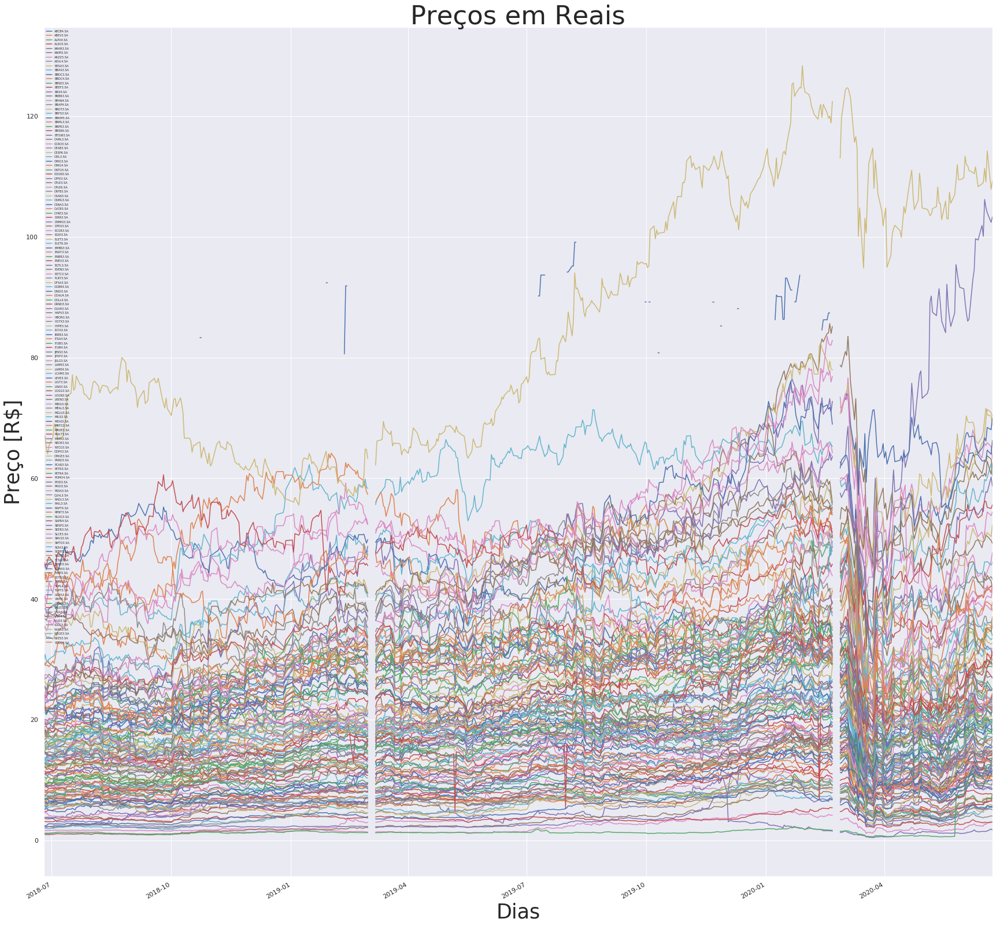

In [57]:
    #PLot ativos com rendimentos positivos e negativos

fig = plt.subplots(figsize=(100,30))
ax1=plt.subplot(1,3,3)
market_close.plot(ax=ax1)
ax1.set_title('Preços em Reais',fontsize=45)
ax1.set_ylabel('Preço [R$]',fontsize=35)
ax1.set_xlabel('Dias',fontsize=35)
ax1.legend(loc='upper left',fontsize=5)

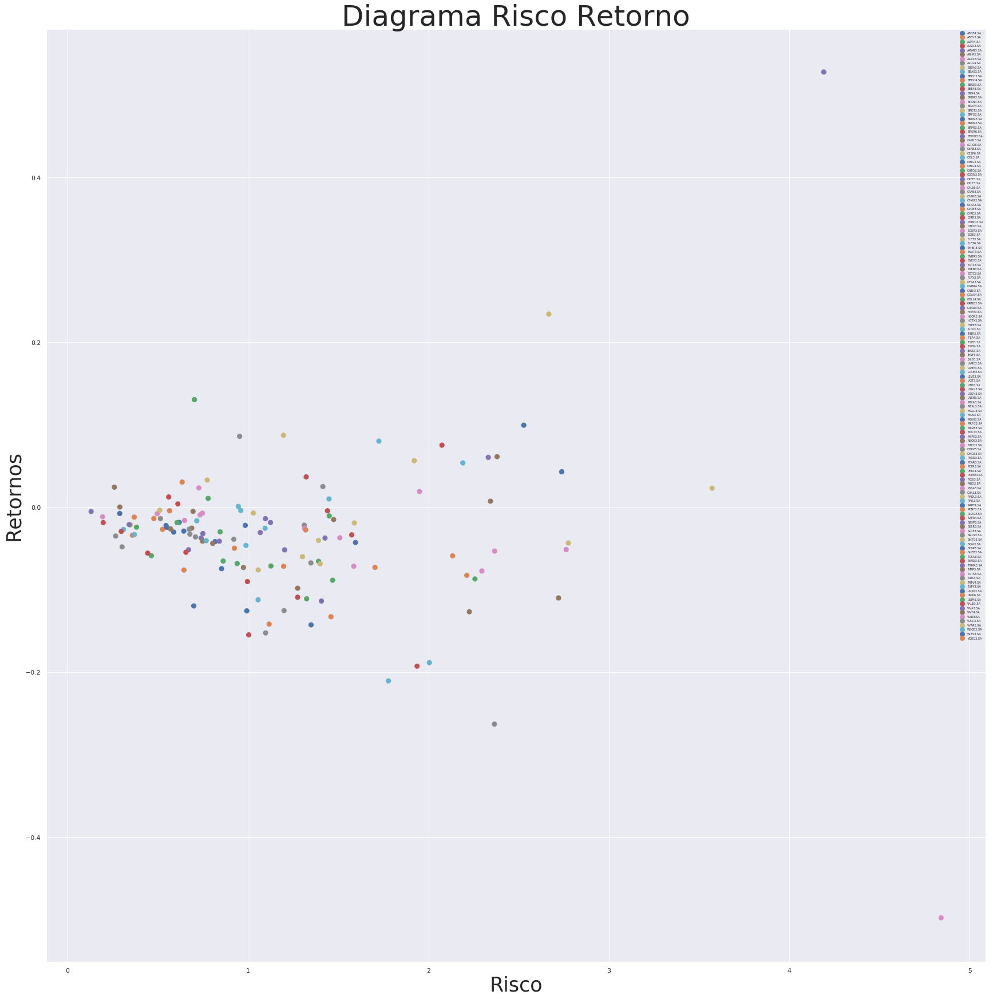

In [60]:
fig = plt.subplots(figsize=(100,30))
ax2=plt.subplot(1,3, 3) 
colors = np.random.rand(5)
x = market_close.diff().dropna().std().values
y = market_close.diff().dropna().mean().values
classes = market_close[market_close.columns].mean().values/market_close[market_close.columns].std().values
lbl = market_close.iloc[0].index

#Plota o diagrama de risco e retorno dos ativos

for i in range(len(x)):
    ax2.scatter(x[i],y[i],  s=10*classes, label = market_close.iloc[0].index[i])

ax2.legend(loc='upper right', fontsize=5)
ax2.set_xlabel("Risco",fontsize=35)
ax2.set_ylabel('Retornos',fontsize=35)
ax2.set_title('Diagrama Risco Retorno',fontsize=50) 

plt.show()

In [61]:
stocks_return = []    
stocks_prices  = []
p_names = []

# Seleciona apenas os ativos com rendimento positivo/negativo

first = []
last = []
ret_in_time = []

for d in market_close:
    first.append(market_close.iloc[0][d])
    last.append(market_close.iloc[-1][d])

    
for num in range(0, len(first)):
    n = last[num]/first[num]
    ret_in_time.append(n)
    
#valor = market_close.dropna().diff().mean()
valor = market_close.diff().mean()


for i in range(len(valor)):
    if (valor[i] > 0):
        p_names.append(valor.index[i])
        stocks_prices.append(ret_in_time[i])
        
market_all=yahoo(p_names,S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)
market_close=market_all['Adj Close']
market_open = market_all['Open']
market_high = market_all['High']
market_low = market_all['Low']


[*********************100%***********************]  122 of 122 downloaded


In [62]:
market_close.tail()

,ABCB4.SA,ALPA4.SA,ALSO3.SA,AMAR3.SA,ANIM3.SA,ARZZ3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,BBDC3.SA,...,TRIS3.SA,TRPL4.SA,TUPY3.SA,USIM5.SA,VALE3.SA,VIVT4.SA,VVAR3.SA,WEGE3.SA,WIZS3.SA,YDUQ3.SA
Date,,,,,,,,,,,,,,,,,,,,,
2020-06-17,15.40,29.10,29.47,8.56,24.19,44.14,22.62,51.20,34.50,20.46,...,10.83,20.50,18.85,6.77,56.20,49.70,15.14,46.16,11.13,34.29
2020-06-18,15.60,29.10,29.71,8.54,23.45,43.95,21.93,50.36,34.40,20.45,...,11.14,20.48,18.80,6.80,56.17,50.50,15.13,46.13,11.09,34.10
2020-06-19,15.49,29.79,30.01,8.81,24.83,44.58,21.80,51.00,33.94,19.99,...,11.10,20.39,19.11,6.98,55.17,50.40,15.18,46.21,10.85,35.24
2020-06-22,15.36,29.33,29.47,8.73,24.88,46.29,20.63,50.33,33.24,19.64,...,12.25,20.55,19.82,6.96,55.00,49.70,14.90,45.60,11.50,35.20
2020-06-23,15.60,30.29,29.30,8.53,25.15,47.67,22.50,52.28,33.53,19.65,...,12.25,20.43,19.45,7.68,55.59,49.22,15.03,46.12,11.39,37.05


In [63]:
market_corr=market_close.pct_change().iloc[0:].corr() 

corr_list  = market_corr.values.tolist()
menores_corr = []
names = []
for col in market_close.columns:
    names.append(col)

# Ranking das menores correlacoes com rendimento positivo

corr_all = pd.DataFrame(data = corr_list, index = names, columns = names)
corr_all

,ABCB4.SA,ALPA4.SA,ALSO3.SA,AMAR3.SA,ANIM3.SA,ARZZ3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,BBDC3.SA,...,TRIS3.SA,TRPL4.SA,TUPY3.SA,USIM5.SA,VALE3.SA,VIVT4.SA,VVAR3.SA,WEGE3.SA,WIZS3.SA,YDUQ3.SA
ABCB4.SA,1.000000,0.539196,0.639923,0.611671,0.610736,0.620472,0.645848,0.624361,0.717089,0.644768,...,0.586933,0.540001,0.437398,0.594052,0.453534,0.398363,0.558064,0.477469,0.502111,0.599297
ALPA4.SA,0.539196,1.000000,0.537833,0.506097,0.496416,0.576317,0.607947,0.478142,0.486234,0.432445,...,0.592731,0.444716,0.337289,0.421827,0.337742,0.361158,0.468405,0.513725,0.415281,0.458727
ALSO3.SA,0.639923,0.537833,1.000000,0.524566,0.532359,0.587654,0.583135,0.580746,0.623114,0.575967,...,0.673213,0.466327,0.380475,0.467318,0.378959,0.421127,0.514715,0.390271,0.518716,0.506062
AMAR3.SA,0.611671,0.506097,0.524566,1.000000,0.525299,0.538851,0.587076,0.461654,0.550116,0.430221,...,0.605206,0.440629,0.355296,0.494812,0.334761,0.281003,0.531002,0.436281,0.395366,0.488972
ANIM3.SA,0.610736,0.496416,0.532359,0.525299,1.000000,0.539833,0.572294,0.528267,0.575512,0.483620,...,0.579297,0.461668,0.347491,0.467735,0.287010,0.256865,0.503171,0.455605,0.443715,0.634991
ARZZ3.SA,0.620472,0.576317,0.587654,0.538851,0.539833,1.000000,0.591079,0.543560,0.593152,0.530909,...,0.563338,0.422422,0.414373,0.561828,0.399407,0.356957,0.530187,0.422742,0.436012,0.557261
AZUL4.SA,0.645848,0.607947,0.583135,0.587076,0.572294,0.591079,1.000000,0.621675,0.670204,0.597790,...,0.642487,0.500148,0.392765,0.588637,0.447044,0.359027,0.580843,0.559529,0.509421,0.513834
B3SA3.SA,0.624361,0.478142,0.580746,0.461654,0.528267,0.543560,0.621675,1.000000,0.719513,0.695673,...,0.552121,0.534654,0.353407,0.535351,0.470486,0.480813,0.540795,0.547598,0.446058,0.489687
BBAS3.SA,0.717089,0.486234,0.623114,0.550116,0.575512,0.593152,0.670204,0.719513,1.000000,0.807315,...,0.586555,0.532119,0.353903,0.649658,0.489498,0.437724,0.588708,0.441495,0.511801,0.528194
BBDC3.SA,0.644768,0.432445,0.575967,0.430221,0.483620,0.530909,0.597790,0.695673,0.807315,1.000000,...,0.499644,0.492674,0.341231,0.573493,0.451788,0.473694,0.466006,0.430495,0.449651,0.483972


Text(0.5, 1.0, 'Correlação entre os ativos')

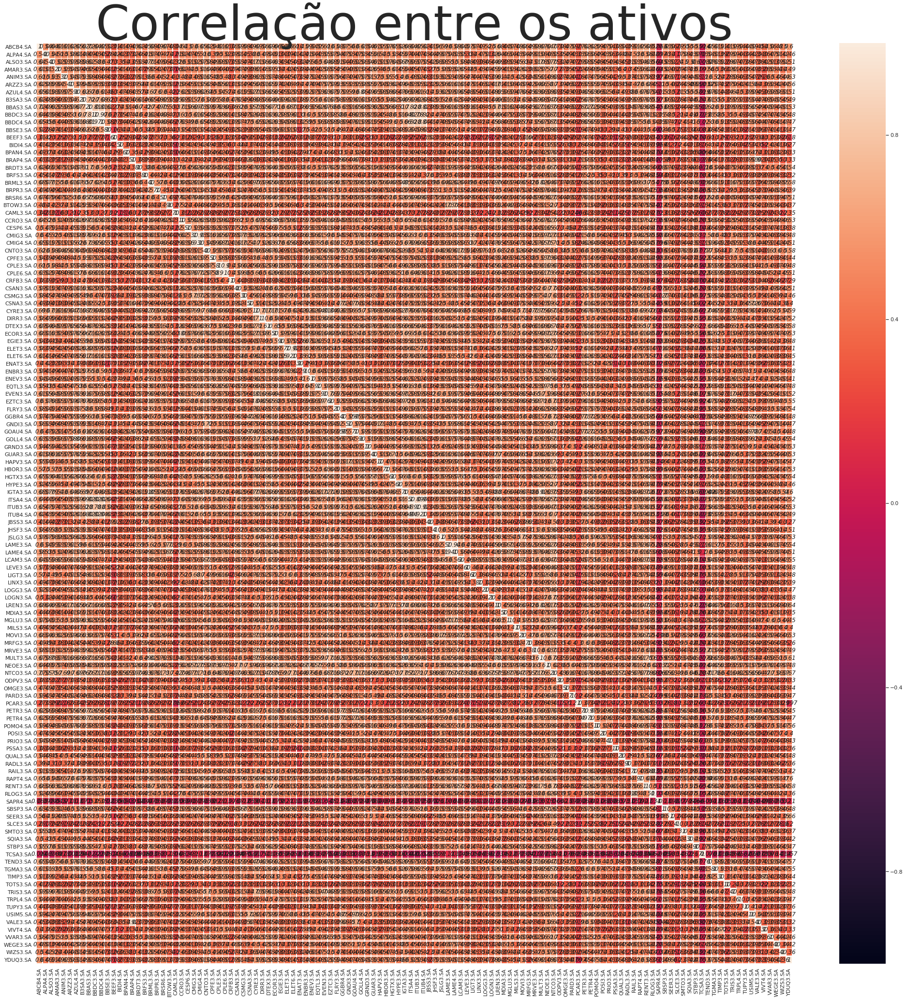

In [64]:
%matplotlib inline 
annot_kws={'fontsize':12, 
           'fontstyle':'italic',  
           'color':"k"}

# Plota o as correlacoes por mapa de calor

fig = plt.subplots(figsize=(35,35))
ax2=plt.subplot(1,1,1)  
sns.heatmap(market_corr, vmin = -1, vmax = 1,
            annot=True, linewidths=0.5, ax=ax2, annot_kws=annot_kws)

sns.set(font_scale = 3)


ax2.set_title("Correlação entre os ativos",fontsize=100)   

In [65]:
# Lista com menores correlacoes
best_corr = []
for i in range(0, len(corr_all)):
    correlation_list = corr_all.mean().sort_values(ascending = True) #True = menores correlacoes
    best_corr.append(correlation_list.index[i])
    
best_corr = Remove(best_corr[:])
best_corr

['TCSA3.SA',
 'SAPR4.SA',
 'PCAR3.SA',
 'SLCE3.SA',
 'CAML3.SA',
 'BEEF3.SA',
 'TOTS3.SA',
 'RADL3.SA',
 'PSSA3.SA',
 'ODPV3.SA',
 'ENAT3.SA',
 'TUPY3.SA',
 'CRFB3.SA',
 'JBSS3.SA',
 'BIDI4.SA',
 'VIVT4.SA',
 'BRAP4.SA',
 'BRFS3.SA',
 'BPAN4.SA',
 'VALE3.SA',
 'LINX3.SA',
 'POSI3.SA',
 'MILS3.SA',
 'SQIA3.SA',
 'WIZS3.SA',
 'LOGN3.SA',
 'MRFG3.SA',
 'MDIA3.SA',
 'OMGE3.SA',
 'LOGG3.SA',
 'BTOW3.SA',
 'BBSE3.SA',
 'QUAL3.SA',
 'WEGE3.SA',
 'TIMP3.SA',
 'SEER3.SA',
 'SMTO3.SA',
 'LEVE3.SA',
 'TRPL4.SA',
 'PRIO3.SA',
 'PARD3.SA',
 'HYPE3.SA',
 'CESP6.SA',
 'CSNA3.SA',
 'HAPV3.SA',
 'YDUQ3.SA',
 'BRPR3.SA',
 'AMAR3.SA',
 'ALPA4.SA',
 'EGIE3.SA',
 'GRND3.SA',
 'ANIM3.SA',
 'RLOG3.SA',
 'LIGT3.SA',
 'GNDI3.SA',
 'CPFE3.SA',
 'JHSF3.SA',
 'VVAR3.SA',
 'DIRR3.SA',
 'ELET3.SA',
 'STBP3.SA',
 'CSMG3.SA',
 'HBOR3.SA',
 'RAIL3.SA',
 'FLRY3.SA',
 'ELET6.SA',
 'ENEV3.SA',
 'USIM5.SA',
 'MRVE3.SA',
 'POMO4.SA',
 'ARZZ3.SA',
 'ENBR3.SA',
 'EQTL3.SA',
 'BRDT3.SA',
 'JSLG3.SA',
 'SBSP3.SA',
 'MGLU3.SA',

In [ ]:
# Plota os valores de preco de ativos

fig = plt.subplots(figsize=(100,30))
ax1=plt.subplot(1,3,3)
market_close.plot(ax=ax1)
ax1.set_title('Preços em Reais',fontsize=45)
ax1.set_ylabel('Preço [R$]',fontsize=35)
ax1.set_xlabel('Dias',fontsize=35)
ax1.legend(loc='upper left',fontsize=10)

In [ ]:
        #Plota o diagrama de risco e retorno dos ativos com rendimento positivo


fig = plt.subplots(figsize=(100,30))
ax2=plt.subplot(1,3, 3) 
colors = np.random.rand(5)
x = market_close.dropna().diff().std().values
y = market_close.dropna().diff().mean().values
classes = market_close[market_close.columns].mean().values/market_close[market_close.columns].std().values

for i in range(len(x)):
    ax2.scatter(x[i],y[i],  s=5*classes, label = market_close.iloc[0].index[i])

ax2.legend(loc='upper right', fontsize=10)
ax2.set_xlabel("Risco",fontsize=35)
ax2.set_ylabel('Retornos',fontsize=35)
ax2.set_title('Diagrama Risco Retorno',fontsize=35) 

plt.show()


<div id="Tópico 2">
    <div class="alert alert-block alert-info" style="margin-top: 0px"> 
</div> </div> 

In [66]:
%matplotlib inline 
import matplotlib.dates as mdates
import datetime
from pandas import *
import matplotlib.mlab as mlab
import scipy.signal as signal
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import pandas_datareader.data as pdr
import yfinance as yf
import datetime as dt
import matplotlib.ticker as mticker
import matplotlib.dates as mdates
import pandas_datareader as web
from mpl_finance import candlestick_ohlc
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression  
import statsmodels.api as sm
import math
sns.set()

def yahoo(symbols,S_Day, S_Month, S_Year, E_Day, E_Month, E_Year):
    yf.pdr_override()      
    stocks_yahoo = pdr.get_data_yahoo(symbols, start=datetime(S_Year, S_Month, S_Day), end=datetime(E_Year, E_Month, E_Day),   as_panel = False,)
    return stocks_yahoo

In [67]:
# Analise dos ativos filtrados

stocks_all=yahoo(best_corr[:],S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)
stocks_close=market_all['Adj Close']
stocks_open = market_all['Open']
stocks_high = market_all['High']
stocks_low = market_all['Low']


best_names = best_corr[:]
stocks_close

[*********************100%***********************]  122 of 122 downloaded


,ABCB4.SA,ALPA4.SA,ALSO3.SA,AMAR3.SA,ANIM3.SA,ARZZ3.SA,AZUL4.SA,B3SA3.SA,BBAS3.SA,BBDC3.SA,...,TRIS3.SA,TRPL4.SA,TUPY3.SA,USIM5.SA,VALE3.SA,VIVT4.SA,VVAR3.SA,WEGE3.SA,WIZS3.SA,YDUQ3.SA
Date,,,,,,,,,,,,,,,,,,,,,
2018-06-25,13.39,9.32,18.65,3.83,16.09,39.31,21.87,19.41,24.25,17.95,...,2.36,12.35,15.55,6.97,44.66,37.75,5.90,15.33,6.94,21.92
2018-06-26,13.43,9.45,18.88,3.80,15.74,40.56,22.00,19.37,24.54,17.97,...,2.36,12.35,15.73,6.93,45.77,37.10,6.03,15.46,6.79,21.66
2018-06-27,13.17,9.19,18.89,3.75,15.39,39.21,21.40,18.96,24.04,17.70,...,2.28,12.24,15.81,6.97,45.59,37.08,5.84,15.23,6.86,21.79
2018-06-28,13.23,9.67,18.50,3.85,15.15,40.51,21.50,19.47,25.42,18.26,...,2.29,12.03,16.30,7.24,46.46,37.11,5.86,15.61,6.81,21.76
2018-06-29,13.23,9.60,18.50,3.84,15.03,42.76,21.33,19.40,25.87,18.66,...,2.27,12.11,16.40,7.13,46.96,37.70,5.89,15.74,6.53,22.13
2018-07-02,13.56,9.60,18.61,3.78,15.34,40.96,20.71,19.58,26.54,18.54,...,2.23,12.19,16.85,7.04,46.17,37.32,5.84,15.21,6.55,22.56
2018-07-03,13.75,9.59,18.60,3.80,15.49,42.21,20.73,19.82,26.77,19.01,...,2.25,12.28,16.52,7.55,45.41,37.49,5.74,15.54,6.39,23.15
2018-07-04,13.93,9.72,19.85,3.85,15.88,42.78,21.00,20.06,27.54,19.40,...,2.27,12.37,16.69,8.01,45.48,37.54,5.72,15.44,6.48,23.46
2018-07-05,13.75,9.81,21.39,3.95,15.05,42.06,20.43,19.93,26.90,19.28,...,2.26,12.33,16.68,7.88,47.06,37.33,5.58,15.52,6.41,23.24


In [68]:
# Calculo do indice Sharpe

ret_free_risk = 0.0225 #Considerando a Taxa Selic de 2018

# Sharpe = (Ret do Ativo - Ret livre de risco) / (Volatilidade do ativo)
def sharpe(ret_ativ, ret_free_risk, ativ_volatility):
    s = (ret_ativ - ret_free_risk)/ativ_volatility
    return s

finals_stocks = pd.DataFrame(index = best_names[:], columns = ['Reg_price','Coef_price','Reg_int','Coef_int'
                                                               ,'Sharpe','Base_price','Target_buy','Target_sell'])

    # Coletando serie historica e calculando variaveis
# Ibovespa
ibov = yahoo('^BVSP',S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)


for i in range(len(best_names)):    
    
        # Calculando retornos diarios e mensais dos 
        
    ativ_daily_returns = stocks_all['Adj Close'][best_names[i]].dropna().pct_change().dropna()
    ativ_monthly_returns = stocks_all['Adj Close'][best_names[i]].dropna().resample('M').sum()
    ativ_monthly_returns = ativ_monthly_returns.pct_change()
    daily_values = ativ_daily_returns.copy()
    monthly_values = ativ_monthly_returns.copy()
    
    
    pos_days = len(daily_values[daily_values >= 0])
    neg_days = len(daily_values[daily_values < 0])
    
    pos_months = len(monthly_values[monthly_values >= 0])
    neg_months = len(monthly_values[monthly_values < 0])
    

    ibov_year_returns = ibov['Adj Close'].dropna().resample('Y').sum()
    ibov_year_returns = ibov_year_returns.pct_change().dropna().mean()
    ibov_mean = ibov['Adj Close'].dropna().mean()
    ibov_std = ibov['Adj Close'].dropna().std()
    ibov_year_volatility = (ibov_mean/ibov_std)


    # Ativo
    ativ_year_returns = stocks_all['Adj Close'][best_names[i]].dropna().resample('Y').sum()
    ativ_year_returns = ativ_year_returns.pct_change().dropna().mean()
    ativ_mean = stocks_all['Adj Close'][best_names[i]].dropna().mean()
    ativ_std = stocks_all['Adj Close'][best_names[i]].dropna().std()

    # Calculando
    sharp = sharpe(ativ_year_returns, ret_free_risk, ativ_std)
    
    
            # TERCEIRO PLOT
    
    log_stocks = stocks_all['Adj Close'][best_names[i]]    # Y
    stocks_index = log_stocks.index                                 #Date
    
    counter = None
    x = None
    y = None

    y = log_stocks.fillna(0)
    counter = np.arange(len(y))
    x = counter[:]
    
    correlacao = np.corrcoef(x,y)
    
    x = x.reshape(-1,1)
    
    regressor = LinearRegression()
    regressor.fit(x,y)
    regressor.coef_
    reg_price = regressor.intercept_
    coef_price = regressor.coef_[0]
    
    base_price_1 = reg_price * (1 + coef_price)
    target_buy_1 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1-coef_price)
    target_sell_1 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1+coef_price)
    
    
            # QUARTO PLOT
         
    log_stocks =  stocks_all['Adj Close'][best_names[i]].pct_change() # Y
    stocks_index = log_stocks.index
    
    counter = None
    x = None
    y = None

    y = log_stocks.fillna(0)
    counter = np.arange(len(y))
    x = counter[:]
        
    correlacao = np.corrcoef(x,y)
    
    x = x.reshape(-1,1)
    
    regressor = LinearRegression()
    regressor.fit(x,y)
    regressor.coef_
    reg_int = regressor.intercept_
    coef_int = regressor.coef_[0]
    
    base_price_2 = reg_price * (1 + coef_int)
    target_buy_2 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1-coef_int)
    target_sell_2 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1+coef_int)
    
    base_price = (base_price_1 + base_price_2) / 2
    target_buy = (target_buy_1 + target_buy_2) / 2
    target_sell = (target_sell_1 + target_sell_2) / 2
    
    finals_stocks['Reg_price'][best_names[i]] = reg_price
    finals_stocks['Coef_price'][best_names[i]] = coef_price
    finals_stocks['Reg_int'][best_names[i]] = reg_int
    finals_stocks['Coef_int'][best_names[i]] = coef_int
    finals_stocks['Sharpe'][best_names[i]] = sharp
    finals_stocks['Base_price'][best_names[i]] = base_price
    finals_stocks['Target_buy'][best_names[i]] = target_buy
    finals_stocks['Target_sell'][best_names[i]] = target_sell
    
    
    print("\n===========>",best_names[i])
    print()
    print("------------------------------------Daily Infos--------------------------------------")
    print("Count:")
    print("              Positive - ",pos_days)
    print("              Negative - ",neg_days)
    print("              Pct Up   - %.2f" % (100*pos_days/(pos_days+neg_days)))
    print()
    print("-----------------------------------Monthly Infos-------------------------------------")
    print("Count:")
    print("              Positive - ",pos_months)
    print("              Negative - ",neg_months)
    #print("              Pct Up   - %.2f" % (100*pos_months/(pos_months+neg_months)))
    print()
    print()
    print("-----------------------------------Other Infos---------------------------------------")
    print("Count:")
    print("              Sharpe      : %.2f" % sharp)
    print()
    print("              R. price    : %.5f" % reg_price)
    print("              Coef_price  : %.8f" % coef_price)
    print()
    print("              R. intercept: %.5f" % reg_int)
    print("              Coef        : %.8f" % coef_int)
    print()
    print("              Target_sell : %.2f" % target_sell)
    print("              Actual_price: %.2f" % stocks_close[best_names[i]].iloc[-1])
    print("              Target_buy  : %.2f" % target_buy)
    print()
    print("              Base_price  : %.2f" % base_price)
    print()
    
    

[*********************100%***********************]  1 of 1 downloaded

===========> TCSA3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  272
              Negative -  218
              Pct Up   - 55.51

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  12
              Negative -  12


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.30

              R. price    : 0.61701
              Coef_price  : 0.00418770

              R. intercept: -0.03307
              Coef        : 0.00021544

              Target_sell : 12.47
              Actual_price: 13.75
              Target_buy  : 12.41

              Base_price  : 0.62


===========> SAPR4.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  259
    


===========> TUPY3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  256
              Negative -  234
              Pct Up   - 52.24

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  12
              Negative -  12


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.07

              R. price    : 18.73090
              Coef_price  : -0.00048249

              R. intercept: 0.00115
              Coef        : -0.00000135

              Target_sell : 19.20
              Actual_price: 19.45
              Target_buy  : 19.21

              Base_price  : 18.73


===========> CRFB3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  255
              Negative -  235
              Pct Up   - 52.04

---------


===========> SQIA3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  271
              Negative -  219
              Pct Up   - 55.31

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  15
              Negative -  9


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.21

              R. price    : 2.72534
              Coef_price  : 0.04030854

              R. intercept: 0.00350
              Coef        : -0.00000131

              Target_sell : 19.77
              Actual_price: 19.50
              Target_buy  : 18.99

              Base_price  : 2.78


===========> WIZS3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  268
              Negative -  222
              Pct Up   - 54.69

-------------


===========> TIMP3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  254
              Negative -  236
              Pct Up   - 51.84

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  12
              Negative -  12


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.16

              R. price    : 10.63757
              Coef_price  : 0.00706696

              R. intercept: -0.00062
              Coef        : 0.00000478

              Target_sell : 14.52
              Actual_price: 14.20
              Target_buy  : 14.41

              Base_price  : 10.68


===========> SEER3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  257
              Negative -  233
              Pct Up   - 52.45

----------


===========> BRPR3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  259
              Negative -  231
              Pct Up   - 52.86

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  11
              Negative -  13


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.19

              R. price    : 7.88406
              Coef_price  : 0.00829045

              R. intercept: 0.00140
              Coef        : -0.00000339

              Target_sell : 9.38
              Actual_price: 9.25
              Target_buy  : 9.30

              Base_price  : 7.92


===========> AMAR3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  258
              Negative -  232
              Pct Up   - 52.65

---------------


===========> VVAR3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  266
              Negative -  224
              Pct Up   - 54.29

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  14
              Negative -  10


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.16

              R. price    : 3.65509
              Coef_price  : 0.01448038

              R. intercept: -0.00215
              Coef        : 0.00002156

              Target_sell : 15.19
              Actual_price: 15.03
              Target_buy  : 14.97

              Base_price  : 3.68


===========> DIRR3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  271
              Negative -  219
              Pct Up   - 55.31

------------


===========> MRVE3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  261
              Negative -  229
              Pct Up   - 53.27

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  13
              Negative -  11


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.20

              R. price    : 9.90376
              Coef_price  : 0.01856351

              R. intercept: 0.00203
              Coef        : -0.00000028

              Target_sell : 17.70
              Actual_price: 18.26
              Target_buy  : 17.37

              Base_price  : 10.00


===========> POMO4.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  267
              Negative -  223
              Pct Up   - 54.49

-----------


===========> CPLE3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  281
              Negative -  209
              Pct Up   - 57.35

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  15
              Negative -  9


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.07

              R. price    : 14.39848
              Coef_price  : 0.11665503

              R. intercept: 0.00465
              Coef        : -0.00000712

              Target_sell : 66.51
              Actual_price: 61.74
              Target_buy  : 59.17

              Base_price  : 15.24


===========> CMIG3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  257
              Negative -  233
              Pct Up   - 52.45

-----------


===========> GOLL4.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  260
              Negative -  230
              Pct Up   - 53.06

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  16
              Negative -  8


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.11

              R. price    : 19.39817
              Coef_price  : 0.02024449

              R. intercept: 0.00601
              Coef        : -0.00001274

              Target_sell : 18.95
              Actual_price: 19.90
              Target_buy  : 18.57

              Base_price  : 19.59


===========> HGTX3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  249
              Negative -  241
              Pct Up   - 50.82

-----------


===========> RAPT4.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  264
              Negative -  226
              Pct Up   - 53.88

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  11
              Negative -  13


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.24

              R. price    : 7.18774
              Coef_price  : 0.00736304

              R. intercept: 0.00268
              Coef        : -0.00000380

              Target_sell : 9.90
              Actual_price: 9.90
              Target_buy  : 9.83

              Base_price  : 7.21


===========> EZTC3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  270
              Negative -  220
              Pct Up   - 55.10

---------------


===========> DTEX3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  265
              Negative -  225
              Pct Up   - 54.08

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  13
              Negative -  11


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.19

              R. price    : 9.32425
              Coef_price  : 0.00890503

              R. intercept: 0.00215
              Coef        : -0.00000189

              Target_sell : 13.41
              Actual_price: 13.45
              Target_buy  : 13.29

              Base_price  : 9.37


===========> BRML3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  253
              Negative -  237
              Pct Up   - 51.63

------------

In [69]:
finals_stocks

,Reg_price,Coef_price,Reg_int,Coef_int,Sharpe,Base_price,Target_buy,Target_sell
TCSA3.SA,0.617005,0.0041877,-0.0330665,0.000215436,0.300981,0.618364,12.4126,12.4674
SAPR4.SA,10.7545,0.00803128,0.00736081,6.57028e-06,0.169088,10.7977,6.38025,6.43175
PCAR3.SA,-12.0214,0.131799,0.00045119,-2.68495e-06,0.271085,-12.8136,63.3919,72.3361
SLCE3.SA,22.8785,-0.00768463,-0.000261769,3.45522e-06,-0.00554668,22.7906,23.6926,23.5114
CAML3.SA,5.96142,0.0053788,-0.000622587,7.5109e-06,0.266041,5.97748,10.7589,10.8171
BEEF3.SA,4.40902,0.0167275,-0.00018492,8.5623e-06,0.260766,4.44591,13.1768,13.3992
TOTS3.SA,27.4605,0.0591788,0.00397144,-1.20007e-05,0.0563499,28.2729,21.9237,23.2603
RADL3.SA,55.2314,0.120909,0.000709108,2.2106e-06,0.0216239,58.5705,103.692,117.036
PSSA3.SA,47.5449,0.0153618,0.0029941,-7.58269e-06,0.051658,47.9099,52.8749,53.6931
ODPV3.SA,13.4939,0.00555756,0.00171455,-4.74941e-06,0.253932,13.5313,14.1406,14.2194


In [70]:
# Acoes 'baratas'
good_stocks = []

for i in range(0, len(finals_stocks)):
    
    a = finals_stocks['Target_buy'][best_names[i]]
    b = stocks_close[best_names[i]].iloc[-1]
  
    if a >= b:
        good_stocks.append(best_names[i])
        
good_stocks

['SLCE3.SA',
 'CAML3.SA',
 'BEEF3.SA',
 'JBSS3.SA',
 'VALE3.SA',
 'MRFG3.SA',
 'TIMP3.SA',
 'SMTO3.SA',
 'BRPR3.SA',
 'AMAR3.SA',
 'GRND3.SA',
 'CPFE3.SA',
 'ELET3.SA',
 'FLRY3.SA',
 'ENBR3.SA',
 'BRDT3.SA',
 'GUAR3.SA',
 'BBDC4.SA',
 'BBDC3.SA',
 'ITUB4.SA',
 'BRSR6.SA',
 'HGTX3.SA',
 'ITUB3.SA',
 'ITSA4.SA',
 'CMIG4.SA',
 'BRML3.SA',
 'LREN3.SA',
 'BBAS3.SA']

In [71]:
    # Apenas ativos com Sharpe > 0

finals_stocks
select = finals_stocks.copy()

select['Sharpe'] = select['Sharpe'] >= 0

select_2 = select.copy()

list_append = []
for i in range(len(select_2)):
        if  select_2.iloc[i]['Sharpe'] == True:
            list_append.append(select_2.index[i])

best_names = list_append
best_names

['TCSA3.SA',
 'SAPR4.SA',
 'PCAR3.SA',
 'CAML3.SA',
 'BEEF3.SA',
 'TOTS3.SA',
 'RADL3.SA',
 'PSSA3.SA',
 'ODPV3.SA',
 'ENAT3.SA',
 'TUPY3.SA',
 'CRFB3.SA',
 'JBSS3.SA',
 'BIDI4.SA',
 'VIVT4.SA',
 'BRAP4.SA',
 'BRFS3.SA',
 'BPAN4.SA',
 'VALE3.SA',
 'LINX3.SA',
 'POSI3.SA',
 'MILS3.SA',
 'SQIA3.SA',
 'WIZS3.SA',
 'LOGN3.SA',
 'MRFG3.SA',
 'MDIA3.SA',
 'OMGE3.SA',
 'LOGG3.SA',
 'BTOW3.SA',
 'BBSE3.SA',
 'QUAL3.SA',
 'WEGE3.SA',
 'TIMP3.SA',
 'SEER3.SA',
 'SMTO3.SA',
 'LEVE3.SA',
 'TRPL4.SA',
 'PRIO3.SA',
 'PARD3.SA',
 'HYPE3.SA',
 'CESP6.SA',
 'CSNA3.SA',
 'HAPV3.SA',
 'YDUQ3.SA',
 'BRPR3.SA',
 'AMAR3.SA',
 'ALPA4.SA',
 'EGIE3.SA',
 'GRND3.SA',
 'ANIM3.SA',
 'RLOG3.SA',
 'LIGT3.SA',
 'GNDI3.SA',
 'CPFE3.SA',
 'JHSF3.SA',
 'VVAR3.SA',
 'DIRR3.SA',
 'ELET3.SA',
 'STBP3.SA',
 'CSMG3.SA',
 'HBOR3.SA',
 'RAIL3.SA',
 'FLRY3.SA',
 'ELET6.SA',
 'ENEV3.SA',
 'USIM5.SA',
 'MRVE3.SA',
 'POMO4.SA',
 'ARZZ3.SA',
 'ENBR3.SA',
 'EQTL3.SA',
 'BRDT3.SA',
 'JSLG3.SA',
 'SBSP3.SA',
 'MGLU3.SA',
 'ALSO3.SA',

In [72]:
    # Apenas ativos com coeficiente linear de retornos e preco > 0 

finals_stocks
select = finals_stocks.copy()

select['Coef_price'] = select['Coef_price'] >= 0
select['Coef_int'] = select['Coef_int'] >= 0

select_2 = select.copy()

list_append = []
for i in range(len(select_2)):
        if(select_2.iloc[i]['Coef_int'] & select_2.iloc[i]['Coef_price'] == True):
            list_append.append(select_2.index[i])

best_names = list_append
best_names


['TCSA3.SA',
 'SAPR4.SA',
 'CAML3.SA',
 'BEEF3.SA',
 'RADL3.SA',
 'ENAT3.SA',
 'BRAP4.SA',
 'BPAN4.SA',
 'POSI3.SA',
 'WIZS3.SA',
 'MRFG3.SA',
 'LOGG3.SA',
 'BTOW3.SA',
 'QUAL3.SA',
 'WEGE3.SA',
 'TIMP3.SA',
 'SMTO3.SA',
 'PRIO3.SA',
 'PARD3.SA',
 'HYPE3.SA',
 'HAPV3.SA',
 'YDUQ3.SA',
 'ANIM3.SA',
 'GNDI3.SA',
 'JHSF3.SA',
 'VVAR3.SA',
 'HBOR3.SA',
 'FLRY3.SA',
 'MGLU3.SA',
 'CSAN3.SA',
 'LAME4.SA',
 'LAME3.SA',
 'CNTO3.SA',
 'NEOE3.SA',
 'NTCO3.SA']

In [73]:
    # Apenas ativos com coeficiente linear de retornos > 0 

finals_stocks
select = finals_stocks.copy()

select['Coef_int'] = select['Coef_int'] >= 0

select_2 = select.copy()

list_append = []
for i in range(len(select_2)):
        if(select_2.iloc[i]['Coef_int'] == True):
            list_append.append(select_2.index[i])

best_names = list_append
best_names


['TCSA3.SA',
 'SAPR4.SA',
 'SLCE3.SA',
 'CAML3.SA',
 'BEEF3.SA',
 'RADL3.SA',
 'ENAT3.SA',
 'BRAP4.SA',
 'BPAN4.SA',
 'VALE3.SA',
 'POSI3.SA',
 'WIZS3.SA',
 'MRFG3.SA',
 'MDIA3.SA',
 'LOGG3.SA',
 'BTOW3.SA',
 'QUAL3.SA',
 'WEGE3.SA',
 'TIMP3.SA',
 'SMTO3.SA',
 'PRIO3.SA',
 'PARD3.SA',
 'HYPE3.SA',
 'HAPV3.SA',
 'YDUQ3.SA',
 'ANIM3.SA',
 'GNDI3.SA',
 'JHSF3.SA',
 'VVAR3.SA',
 'HBOR3.SA',
 'FLRY3.SA',
 'MGLU3.SA',
 'GGBR4.SA',
 'CSAN3.SA',
 'LAME4.SA',
 'LAME3.SA',
 'GOAU4.SA',
 'CNTO3.SA',
 'NEOE3.SA',
 'NTCO3.SA']

In [78]:
    # Apenas ativos com coeficiente linear > 0 e Sharpe 

finals_stocks
select = finals_stocks.copy()

select['Coef_price'] = select['Coef_price'] >= 0
select['Coef_int'] = select['Coef_int'] >= 0
select['Sharpe'] = select['Sharpe'] >= 0

select_2 = select.copy()

list_append = []
for i in range(len(select_2)):
        if select_2.iloc[i]['Coef_price'] & select_2.iloc[i]['Coef_int'] == True:
            if  select_2.iloc[i]['Sharpe'] == True:
                list_append.append(select_2.index[i])

best_names = list_append
best_names

['TCSA3.SA',
 'SAPR4.SA',
 'CAML3.SA',
 'BEEF3.SA',
 'RADL3.SA',
 'ENAT3.SA',
 'BRAP4.SA',
 'BPAN4.SA',
 'POSI3.SA',
 'WIZS3.SA',
 'MRFG3.SA',
 'LOGG3.SA',
 'BTOW3.SA',
 'QUAL3.SA',
 'WEGE3.SA',
 'TIMP3.SA',
 'SMTO3.SA',
 'PRIO3.SA',
 'PARD3.SA',
 'HYPE3.SA',
 'HAPV3.SA',
 'YDUQ3.SA',
 'ANIM3.SA',
 'GNDI3.SA',
 'JHSF3.SA',
 'VVAR3.SA',
 'HBOR3.SA',
 'FLRY3.SA',
 'MGLU3.SA',
 'CSAN3.SA',
 'LAME4.SA',
 'LAME3.SA',
 'CNTO3.SA',
 'NTCO3.SA']

In [75]:
    # Apenas ativos com coeficiente linear < 0 

finals_stocks
select = finals_stocks.copy()

select['Coef_int'] = select['Coef_int'] <= 0

select_2 = select.copy()

list_append = []
for i in range(len(select_2)):
        if(select_2.iloc[i]['Coef_int'] == True):
            list_append.append(select_2.index[i])

best_names = list_append
best_names

['PCAR3.SA',
 'TOTS3.SA',
 'PSSA3.SA',
 'ODPV3.SA',
 'TUPY3.SA',
 'CRFB3.SA',
 'JBSS3.SA',
 'BIDI4.SA',
 'VIVT4.SA',
 'BRFS3.SA',
 'LINX3.SA',
 'MILS3.SA',
 'SQIA3.SA',
 'LOGN3.SA',
 'OMGE3.SA',
 'BBSE3.SA',
 'SEER3.SA',
 'LEVE3.SA',
 'TRPL4.SA',
 'CESP6.SA',
 'CSNA3.SA',
 'BRPR3.SA',
 'AMAR3.SA',
 'ALPA4.SA',
 'EGIE3.SA',
 'GRND3.SA',
 'RLOG3.SA',
 'LIGT3.SA',
 'CPFE3.SA',
 'DIRR3.SA',
 'ELET3.SA',
 'STBP3.SA',
 'CSMG3.SA',
 'RAIL3.SA',
 'ELET6.SA',
 'ENEV3.SA',
 'USIM5.SA',
 'MRVE3.SA',
 'POMO4.SA',
 'ARZZ3.SA',
 'ENBR3.SA',
 'EQTL3.SA',
 'BRDT3.SA',
 'JSLG3.SA',
 'SBSP3.SA',
 'ALSO3.SA',
 'TRIS3.SA',
 'CPLE3.SA',
 'CMIG3.SA',
 'GUAR3.SA',
 'BBDC4.SA',
 'LCAM3.SA',
 'BBDC3.SA',
 'ITUB4.SA',
 'TGMA3.SA',
 'BRSR6.SA',
 'GOLL4.SA',
 'HGTX3.SA',
 'ITUB3.SA',
 'TEND3.SA',
 'EVEN3.SA',
 'CCRO3.SA',
 'ITSA4.SA',
 'B3SA3.SA',
 'CPLE6.SA',
 'RAPT4.SA',
 'EZTC3.SA',
 'AZUL4.SA',
 'RENT3.SA',
 'PETR4.SA',
 'MOVI3.SA',
 'CMIG4.SA',
 'PETR3.SA',
 'ABCB4.SA',
 'ECOR3.SA',
 'DTEX3.SA',
 'BRML3.SA',

In [76]:
    # Apenas ativos com coeficiente linear e retorno < 0 

finals_stocks
select = finals_stocks.copy()

select['Coef_price'] = select['Coef_price'] <= 0
select['Coef_int'] = select['Coef_int'] <= 0

select_2 = select.copy()

list_append = []
for i in range(len(select_2)):
        if(select_2.iloc[i]['Coef_int'] & select_2.iloc[i]['Coef_price'] == True):
            list_append.append(select_2.index[i])

best_names = list_append
best_names

['TUPY3.SA',
 'LEVE3.SA',
 'USIM5.SA',
 'POMO4.SA',
 'ITUB4.SA',
 'BRSR6.SA',
 'PETR3.SA']

In [77]:
    # Apenas ativos com coeficiente linear, retorno e sharpe < 0  

finals_stocks
select = finals_stocks.copy()

select['Coef_price'] = select['Coef_price'] <= 0
select['Coef_int'] = select['Coef_int'] <= 0
select['Sharpe'] = select['Sharpe'] <= 0

select_2 = select.copy()

list_append = []
for i in range(len(select_2)):
        if select_2.iloc[i]['Coef_price'] & select_2.iloc[i]['Coef_int'] == True:
            if  select_2.iloc[i]['Sharpe'] == True:
                list_append.append(select_2.index[i])

best_names = list_append
best_names

[]

In [ ]:
#best_names = ['']

In [79]:
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

# Define o peridodo a ser analisado

today = dt.date.today()
E_Day = today.day; E_Month = today.month; E_Year = today.year
day_before = today - dt.timedelta(n_months)
S_Day = day_before.day; S_Month = day_before.month; S_Year = day_before.year


# Analise dos ativos filtrados

stocks_all=yahoo(best_names[:],S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)
stocks_all.tail()

[*********************100%***********************]  34 of 34 downloaded


Adj Close                                                        \
            ANIM3.SA BEEF3.SA BPAN4.SA BRAP4.SA BTOW3.SA CAML3.SA CNTO3.SA   
Date                                                                         
2020-06-17     24.19    13.42     8.67    37.16   106.20    10.86    33.70   
2020-06-18     23.45    13.46     8.56    37.13   104.88    10.79    33.60   
2020-06-19     24.83    13.64     8.92    36.06   104.00    10.78    35.12   
2020-06-22     24.88    12.98     8.95    36.07   102.40    10.88    34.68   
2020-06-23     25.15    12.94     9.75    36.82   103.30    10.63    33.90   

                                       ...     Volume                        \
           CSAN3.SA ENAT3.SA FLRY3.SA  ...   QUAL3.SA   RADL3.SA   SAPR4.SA   
Date                                   ...                                    
2020-06-17    69.82    10.60    26.19  ...  5269600.0  1239800.0  2853800.0   
2020-06-18    71.60    10.32    26.00  ...  4793500.0  1571000.0  2268900.0   
2020-06-19    70.54    10.16    25.11  ...  6207600.0  2264600.0  3896300.0   
2020-06-22    70.29    10.93    24.80  ...  7002900.0  2707300.0  4666700.0   
2020-06-23    68.76    11.11    25.15  ...        0.0        0.0        0.0   

                                                                      \
             SMTO3.SA   TCSA3.SA    TIMP3.SA     VVAR3.SA   WEGE3.SA   
Date                                                                   
2020-06-17  1106400.0  3351400.0  10790000.0  148586900.0  4744600.0   
2020-06-18  2499800.0  3782600.0   5483000.0   82450700.0  2622600.0   
2020-06-19  1752500.0  4717300.0   9367700.0   93795500.0  8316600.0   
2020-06-22  1508500.0  3895500.0   4523100.0   52952500.0  2975200.0   
2020-06-23        0.0        0.0         0.0          0.0        0.0   

                                 
            WIZS3.SA   YDUQ3.SA  
Date                             
2020-06-17  851300.0  3785500.0  
2020-06-18  490900.0  3249900.0  
2020-06-19  896800.0  4672000.0  
2020-06-22  911300.0  3710900.0  
2020-06-23       0.0        0.0  

[5 rows x 204 columns]

In [80]:
index = stocks_all.index

In [81]:
# Calculo do indice Sharpe

ret_free_risk = 0.0225 #Considerando a Taxa Selic de 2018

# Sharpe = (Ret do Ativo - Ret livre de risco) / (Volatilidade do ativo)
def sharpe(ret_ativ, ret_free_risk, ativ_volatility):
    s = (ret_ativ - ret_free_risk)/ativ_volatility
    return s

finals_stocks = pd.DataFrame(index = best_names[:], columns = ['Reg_price','Coef_price','Reg_int','Coef_int'
                                                               ,'Sharpe','Base_price','Target_buy','Target_sell'])

    # Coletando serie historica e calculando variaveis
# Ibovespa
ibov = yahoo('^BVSP',S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)


for i in range(len(best_names)):    
    
        # Calculando retornos diarios e mensais dos 
        
    ativ_daily_returns = stocks_all['Adj Close'][best_names[i]].dropna().pct_change().dropna()
    ativ_monthly_returns = stocks_all['Adj Close'][best_names[i]].dropna().resample('M').sum()
    ativ_monthly_returns = ativ_monthly_returns.pct_change()
    daily_values = ativ_daily_returns.copy()
    monthly_values = ativ_monthly_returns.copy()
    
    
    pos_days = len(daily_values[daily_values >= 0])
    neg_days = len(daily_values[daily_values < 0])
    
    pos_months = len(monthly_values[monthly_values >= 0])
    neg_months = len(monthly_values[monthly_values < 0])
    

    ibov_year_returns = ibov['Adj Close'].dropna().resample('Y').sum()
    ibov_year_returns = ibov_year_returns.pct_change().dropna().mean()
    ibov_mean = ibov['Adj Close'].dropna().mean()
    ibov_std = ibov['Adj Close'].dropna().std()
    ibov_year_volatility = (ibov_mean/ibov_std)


    # Ativo
    ativ_year_returns = stocks_all['Adj Close'][best_names[i]].dropna().resample('Y').sum()
    ativ_year_returns = ativ_year_returns.pct_change().dropna().mean()
    ativ_mean = stocks_all['Adj Close'][best_names[i]].dropna().mean()
    ativ_std = stocks_all['Adj Close'][best_names[i]].dropna().std()

    # Calculando
    sharp = sharpe(ativ_year_returns, ret_free_risk, ativ_std)
    
    
            # TERCEIRO PLOT
    
    log_stocks = stocks_all['Adj Close'][best_names[i]]    # Y
    stocks_index = log_stocks.index                                 #Date
    
    counter = None
    x = None
    y = None

    y = log_stocks.fillna(0)
    counter = np.arange(len(y))
    x = counter[:]
    
    correlacao = np.corrcoef(x,y)
    
    x = x.reshape(-1,1)
    
    regressor = LinearRegression()
    regressor.fit(x,y)
    regressor.coef_
    reg_price = regressor.intercept_
    coef_price = regressor.coef_[0]
    
    base_price_1 = reg_price * (1 + coef_price)
    target_buy_1 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1-coef_price)
    target_sell_1 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1+coef_price)
    
    
            # QUARTO PLOT
         
    log_stocks =  stocks_all['Adj Close'][best_names[i]].pct_change() # Y
    stocks_index = log_stocks.index
    
    counter = None
    x = None
    y = None

    y = log_stocks.fillna(0)
    counter = np.arange(len(y))
    x = counter[:]
        
    correlacao = np.corrcoef(x,y)
    
    x = x.reshape(-1,1)
    
    regressor = LinearRegression()
    regressor.fit(x,y)
    regressor.coef_
    reg_int = regressor.intercept_
    coef_int = regressor.coef_[0]
    
    base_price_2 = reg_price * (1 + coef_int)
    target_buy_2 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1-coef_int)
    target_sell_2 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1+coef_int)
    
    base_price = (base_price_1 + base_price_2) / 2
    target_buy = (target_buy_1 + target_buy_2) / 2
    target_sell = (target_sell_1 + target_sell_2) / 2
    
    finals_stocks['Reg_price'][best_names[i]] = reg_price
    finals_stocks['Coef_price'][best_names[i]] = coef_price
    finals_stocks['Reg_int'][best_names[i]] = reg_int
    finals_stocks['Coef_int'][best_names[i]] = coef_int
    finals_stocks['Sharpe'][best_names[i]] = sharp
    finals_stocks['Base_price'][best_names[i]] = base_price
    finals_stocks['Target_buy'][best_names[i]] = target_buy
    finals_stocks['Target_sell'][best_names[i]] = target_sell
    
    
    print("\n===========>",best_names[i])
    print()
    print("------------------------------------Daily Infos--------------------------------------")
    print("Count:")
    print("              Positive - ",pos_days)
    print("              Negative - ",neg_days)
    print("              Pct Up   - %.2f" % (100*pos_days/(pos_days+neg_days)))
    print()
    print("-----------------------------------Monthly Infos-------------------------------------")
    print("Count:")
    print("              Positive - ",pos_months)
    print("              Negative - ",neg_months)
    print("              Pct Up   - %.2f" % (100*pos_months/(pos_months+neg_months)))
    print()
    print()
    print("-----------------------------------Other Infos---------------------------------------")
    print("Count:")
    print("              Sharpe      : %.2f" % sharp)
    print()
    print("              R. price    : %.5f" % reg_price)
    print("              Coef_price  : %.8f" % coef_price)
    print()
    print("              R. intercept: %.5f" % reg_int)
    print("              Coef        : %.8f" % coef_int)
    print()
    print("              Target_sell : %.2f" % target_sell)
    print("              Actual_price: %.2f" % stocks_close[best_names[i]].iloc[-1])
    print("              Target_buy  : %.2f" % target_buy)
    print()
    print("              Base_price  : %.2f" % base_price)
    print()
    
    

[*********************100%***********************]  1 of 1 downloaded

===========> TCSA3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  272
              Negative -  218
              Pct Up   - 55.51

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  12
              Negative -  12
              Pct Up   - 50.00


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.30

              R. price    : 0.61701
              Coef_price  : 0.00418770

              R. intercept: -0.03307
              Coef        : 0.00021544

              Target_sell : 12.47
              Actual_price: 13.75
              Target_buy  : 12.41

              Base_price  : 0.62


===========> SAPR4.SA

------------------------------------Daily Infos--------------------------------------
Count:
   


===========> TIMP3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  254
              Negative -  236
              Pct Up   - 51.84

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  12
              Negative -  12
              Pct Up   - 50.00


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.16

              R. price    : 10.63757
              Coef_price  : 0.00706696

              R. intercept: -0.00062
              Coef        : 0.00000478

              Target_sell : 14.52
              Actual_price: 14.20
              Target_buy  : 14.41

              Base_price  : 10.68


===========> SMTO3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  260
              Negative -  230
           


===========> LAME4.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  264
              Negative -  226
              Pct Up   - 53.88

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  13
              Negative -  11
              Pct Up   - 54.17


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : 0.08

              R. price    : 14.31587
              Coef_price  : 0.02187904

              R. intercept: -0.00052
              Coef        : 0.00001016

              Target_sell : 33.20
              Actual_price: 32.69
              Target_buy  : 32.48

              Base_price  : 14.47


===========> LAME3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  273
              Negative -  217
           

In [82]:
finals_stocks['Coef_int'].sort_values(ascending = False)

TCSA3.SA    0.000215436
VVAR3.SA    2.15572e-05
MRFG3.SA    1.46347e-05
POSI3.SA    1.32709e-05
CNTO3.SA     1.2222e-05
LAME3.SA    1.16343e-05
LAME4.SA    1.01574e-05
BTOW3.SA    1.00823e-05
BEEF3.SA     8.5623e-06
MGLU3.SA    8.19239e-06
LOGG3.SA    7.89953e-06
WEGE3.SA    7.62577e-06
CAML3.SA     7.5109e-06
NTCO3.SA    6.86945e-06
SAPR4.SA    6.57028e-06
HAPV3.SA    6.53012e-06
WIZS3.SA    4.90896e-06
TIMP3.SA    4.78377e-06
PRIO3.SA    4.60641e-06
FLRY3.SA    3.34209e-06
ANIM3.SA    3.04381e-06
CSAN3.SA    2.87529e-06
QUAL3.SA    2.55882e-06
RADL3.SA     2.2106e-06
YDUQ3.SA    2.19886e-06
ENAT3.SA    2.17453e-06
HYPE3.SA    2.12595e-06
BPAN4.SA    1.14657e-06
BRAP4.SA    1.10094e-06
PARD3.SA    9.75291e-07
GNDI3.SA    9.09588e-07
SMTO3.SA    6.23344e-07
JHSF3.SA    3.21715e-07
HBOR3.SA     3.0645e-07
Name: Coef_int, dtype: object

In [83]:
finals_stocks['Reg_int'].sort_values(ascending = False)

SAPR4.SA     0.00736081
BPAN4.SA     0.00452361
JHSF3.SA     0.00449347
HBOR3.SA     0.00374677
PRIO3.SA     0.00359678
GNDI3.SA      0.0024242
MGLU3.SA     0.00178097
YDUQ3.SA     0.00127999
BTOW3.SA     0.00124689
QUAL3.SA     0.00123333
CSAN3.SA     0.00113666
BRAP4.SA    0.000846798
PARD3.SA    0.000793996
WEGE3.SA    0.000715362
ENAT3.SA    0.000712814
RADL3.SA    0.000709108
ANIM3.SA    0.000693415
SMTO3.SA    0.000642296
HYPE3.SA    0.000411311
HAPV3.SA    0.000392389
WIZS3.SA    0.000310008
LOGG3.SA   -2.64895e-05
BEEF3.SA    -0.00018492
CNTO3.SA   -0.000234582
FLRY3.SA   -0.000310413
POSI3.SA   -0.000346148
LAME4.SA   -0.000520691
TIMP3.SA   -0.000620835
CAML3.SA   -0.000622587
LAME3.SA   -0.000781557
NTCO3.SA    -0.00100098
MRFG3.SA    -0.00201745
VVAR3.SA    -0.00215081
TCSA3.SA     -0.0330665
Name: Reg_int, dtype: object

In [84]:
ranking = pd.DataFrame()
ranking['pos'] = range(1,len(finals_stocks)+1)
ranking['Coef_int'] = finals_stocks['Coef_int'].sort_values(ascending = False).index
ranking['Reg_int'] = finals_stocks['Reg_int'].sort_values(ascending = False).index
ranking

,pos,Coef_int,Reg_int
0,1,TCSA3.SA,SAPR4.SA
1,2,VVAR3.SA,BPAN4.SA
2,3,MRFG3.SA,JHSF3.SA
3,4,POSI3.SA,HBOR3.SA
4,5,CNTO3.SA,PRIO3.SA
5,6,LAME3.SA,GNDI3.SA
6,7,LAME4.SA,MGLU3.SA
7,8,BTOW3.SA,YDUQ3.SA
8,9,BEEF3.SA,BTOW3.SA
9,10,MGLU3.SA,QUAL3.SA


In [85]:
a = ranking.pivot_table(columns='Coef_int', values='pos')
b = ranking.pivot_table(columns='Reg_int', values='pos')
t = pd.concat([a,b])
rank = t.dropna(axis=1).sum()
lista = list(rank.sort_values(ascending = True).index[:])
lista

['SAPR4.SA',
 'BTOW3.SA',
 'MGLU3.SA',
 'PRIO3.SA',
 'WEGE3.SA',
 'CNTO3.SA',
 'BPAN4.SA',
 'POSI3.SA',
 'BEEF3.SA',
 'YDUQ3.SA',
 'CSAN3.SA',
 'QUAL3.SA',
 'LOGG3.SA',
 'LAME4.SA',
 'VVAR3.SA',
 'TCSA3.SA',
 'MRFG3.SA',
 'JHSF3.SA',
 'LAME3.SA',
 'HAPV3.SA',
 'GNDI3.SA',
 'ANIM3.SA',
 'HBOR3.SA',
 'WIZS3.SA',
 'RADL3.SA',
 'ENAT3.SA',
 'BRAP4.SA',
 'CAML3.SA',
 'PARD3.SA',
 'NTCO3.SA',
 'FLRY3.SA',
 'HYPE3.SA',
 'TIMP3.SA',
 'SMTO3.SA']

In [96]:
best_names = lista[:10]
best_names

['SAPR4.SA',
 'BTOW3.SA',
 'MGLU3.SA',
 'PRIO3.SA',
 'WEGE3.SA',
 'CNTO3.SA',
 'BPAN4.SA',
 'POSI3.SA',
 'BEEF3.SA',
 'YDUQ3.SA']

In [89]:
# Define o peridodo a ser analisado

today = dt.date.today()
E_Day = today.day; E_Month = today.month; E_Year = today.year
day_before = today - dt.timedelta(n_months)
S_Day = day_before.day; S_Month = day_before.month; S_Year = day_before.year


# Analise dos ativos filtrados

stocks_all=yahoo(best_names[:],S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)
stocks_all.tail()

index = stocks_all.index
stocks_all.dropna()
stocks_close = stocks_all['Adj Close']
stocks_all.tail()

[*********************100%***********************]  10 of 10 downloaded


Adj Close                                                        \
            BEEF3.SA BPAN4.SA BTOW3.SA CNTO3.SA MGLU3.SA POSI3.SA PRIO3.SA   
Date                                                                         
2020-06-17     13.42     8.67   106.20    33.70    67.19     5.31    33.33   
2020-06-18     13.46     8.56   104.88    33.60    69.70     5.37    35.17   
2020-06-19     13.64     8.92   104.00    35.12    71.40     5.29    35.12   
2020-06-22     12.98     8.95   102.40    34.68    70.90     5.53    34.60   
2020-06-23     12.94     9.75   103.30    33.90    70.25     5.65    35.66   

                                       ...      Volume                        \
           SAPR4.SA WEGE3.SA YDUQ3.SA  ...    BEEF3.SA   BPAN4.SA   BTOW3.SA   
Date                                   ...                                     
2020-06-17     6.25    46.16    34.29  ...  13315200.0  3736700.0  4704400.0   
2020-06-18     6.26    46.13    34.10  ...   8972900.0  5259200.0  2974100.0   
2020-06-19     6.50    46.21    35.24  ...  12948500.0  9706100.0  3827300.0   
2020-06-22     6.53    45.60    35.20  ...   9356500.0  6297100.0  2328700.0   
2020-06-23     6.49    46.12    37.05  ...         0.0        0.0        0.0   

                                                                               \
             CNTO3.SA    MGLU3.SA   POSI3.SA   PRIO3.SA   SAPR4.SA   WEGE3.SA   
Date                                                                            
2020-06-17  1934300.0  19341900.0  5058900.0  2419300.0  2853800.0  4744600.0   
2020-06-18  2070300.0  19522200.0  4457200.0  3589400.0  2268900.0  2622600.0   
2020-06-19  2489900.0  20071500.0  5787400.0  4697800.0  3896300.0  8316600.0   
2020-06-22  1699900.0   9359400.0  7415500.0  2002700.0  4666700.0  2975200.0   
2020-06-23        0.0         0.0        0.0        0.0        0.0        0.0   

                       
             YDUQ3.SA  
Date                   
2020-06-17  3785500.0  
2020-06-18  3249900.0  
2020-06-19  4672000.0  
2020-06-22  3710900.0  
2020-06-23        0.0  

[5 rows x 60 columns]

In [91]:
stocks_corr=stocks_close.pct_change().iloc[0:].corr() 

corr_list  = stocks_corr.values.tolist()
menores_corr = []
names = []
for col in stocks_close.columns:
    names.append(col)

# Ranking das menores correlacoes com rendimento positivo

corr_all = pd.DataFrame(data = corr_list, index = names, columns = names)
corr_all

,BEEF3.SA,BPAN4.SA,BTOW3.SA,CNTO3.SA,MGLU3.SA,POSI3.SA,PRIO3.SA,SAPR4.SA,WEGE3.SA,YDUQ3.SA
BEEF3.SA,1.000000,0.290668,0.364995,0.326065,0.411268,0.215387,0.325192,0.034668,0.383544,0.179447
BPAN4.SA,0.290668,1.000000,0.328224,0.363717,0.407289,0.293872,0.383831,0.043151,0.321345,0.326890
BTOW3.SA,0.364995,0.328224,1.000000,0.458837,0.686349,0.275226,0.375444,0.016747,0.440695,0.371138
CNTO3.SA,0.326065,0.363717,0.458837,1.000000,0.595038,0.485131,0.620577,0.036027,0.596543,0.580967
MGLU3.SA,0.411268,0.407289,0.686349,0.595038,1.000000,0.390831,0.461222,0.080712,0.500559,0.451554
POSI3.SA,0.215387,0.293872,0.275226,0.485131,0.390831,1.000000,0.444403,0.068362,0.367074,0.400005
PRIO3.SA,0.325192,0.383831,0.375444,0.620577,0.461222,0.444403,1.000000,0.037831,0.443363,0.434486
SAPR4.SA,0.034668,0.043151,0.016747,0.036027,0.080712,0.068362,0.037831,1.000000,0.084798,0.108605
WEGE3.SA,0.383544,0.321345,0.440695,0.596543,0.500559,0.367074,0.443363,0.084798,1.000000,0.423297
YDUQ3.SA,0.179447,0.326890,0.371138,0.580967,0.451554,0.400005,0.434486,0.108605,0.423297,1.000000


Text(0.5, 1.0, 'Correlação entre os ativos')

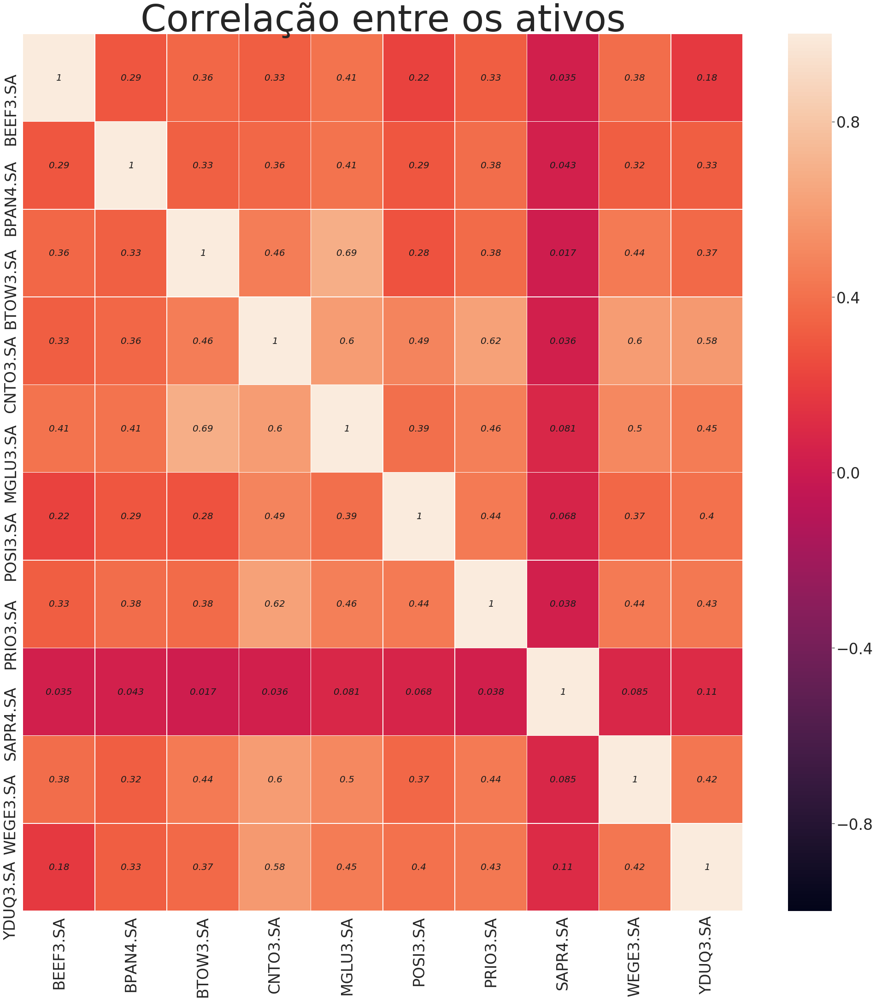

In [109]:
%matplotlib inline 
annot_kws={'fontsize':20, 
           'fontstyle':'italic',  
           'color':"k"}

# Plota o as correlacoes por mapa de calor

fig = plt.subplots(figsize=(35,35))
ax2=plt.subplot(1,1,1)  
sns.heatmap(corr_all, vmin = -1, vmax = 1,
            annot=True, linewidths=0.5, ax=ax2, annot_kws=annot_kws)

sns.set(font_scale = 3)


ax2.set_title("Correlação entre os ativos",fontsize=80)   

In [99]:
best_corr = []
for i in range(0, len(corr_all)):
    correlation_list = corr_all.mean().sort_values(ascending = True) #True = menores correlacoes
    best_corr.append(correlation_list.index[i])
    
best_corr = Remove(best_corr[:])
best_corr

['SAPR4.SA',
 'BEEF3.SA',
 'BPAN4.SA',
 'POSI3.SA',
 'YDUQ3.SA',
 'BTOW3.SA',
 'PRIO3.SA',
 'WEGE3.SA',
 'MGLU3.SA',
 'CNTO3.SA']

In [103]:
ranking = pd.DataFrame()
ranking['pos'] = range(1,len(best_names)+1)
ranking['Coefs'] = best_names
ranking['Corre'] = best_corr
ranking

,pos,Coefs,Corre
0,1,SAPR4.SA,SAPR4.SA
1,2,BTOW3.SA,BEEF3.SA
2,3,MGLU3.SA,BPAN4.SA
3,4,PRIO3.SA,POSI3.SA
4,5,WEGE3.SA,YDUQ3.SA
5,6,CNTO3.SA,BTOW3.SA
6,7,BPAN4.SA,PRIO3.SA
7,8,POSI3.SA,WEGE3.SA
8,9,BEEF3.SA,MGLU3.SA
9,10,YDUQ3.SA,CNTO3.SA


In [104]:
a = ranking.pivot_table(columns='Coefs', values='pos')
b = ranking.pivot_table(columns='Corre', values='pos')
t = pd.concat([a,b])
rank = t.dropna(axis=1).sum()
lista = list(rank.sort_values(ascending = True).index[:])
lista

['SAPR4.SA',
 'BTOW3.SA',
 'BPAN4.SA',
 'BEEF3.SA',
 'PRIO3.SA',
 'MGLU3.SA',
 'POSI3.SA',
 'WEGE3.SA',
 'YDUQ3.SA',
 'CNTO3.SA']

In [105]:
best_names = lista[:]

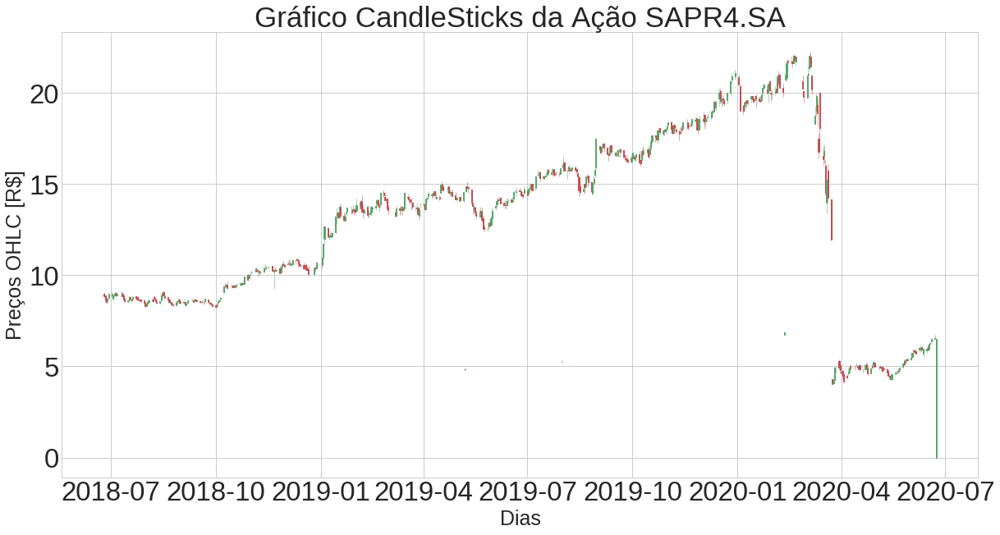

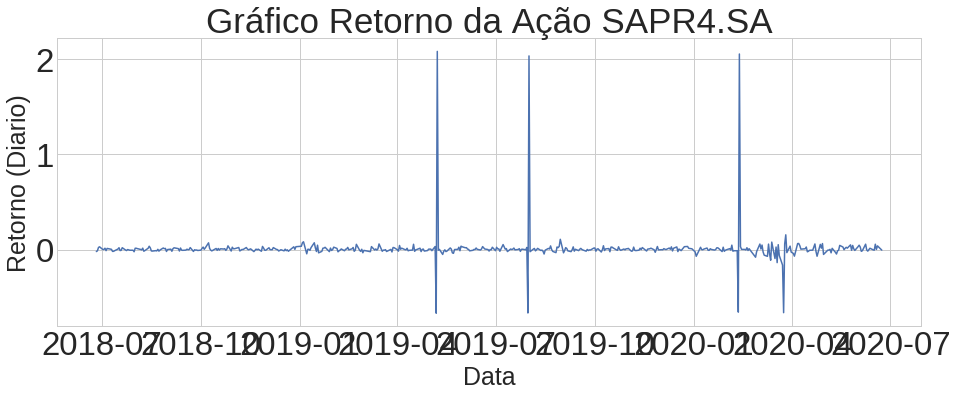

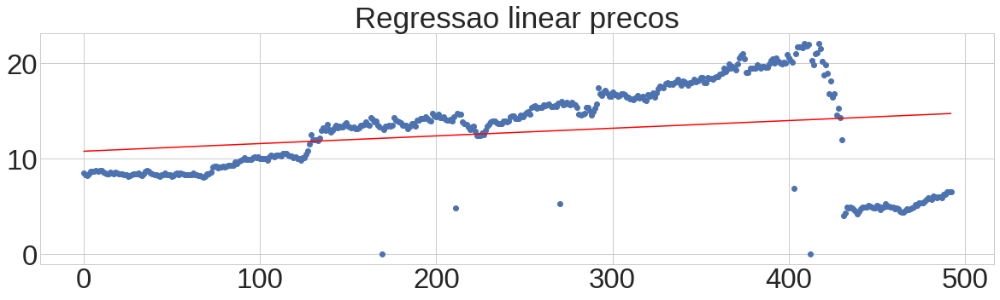

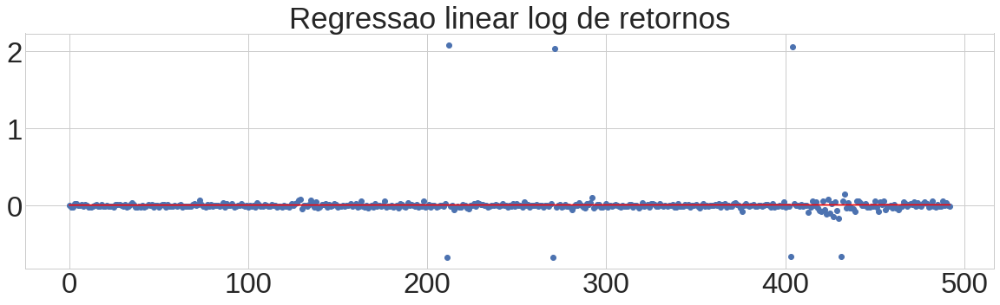


===========> SAPR4.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  259
              Negative -  231
              Pct Up   - 52.86

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  261
              Negative -  231
              Pct Up   - 53.05


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.00

              R. price    : 10.75451
              Coef_price  : 0.00803128

              R. intercept: 0.00736
              Coef        : 0.00000657

              Target_sell : 6.43
              Actual_price: 6.49
              Target_buy  : 6.38

              Base_price  : 10.80






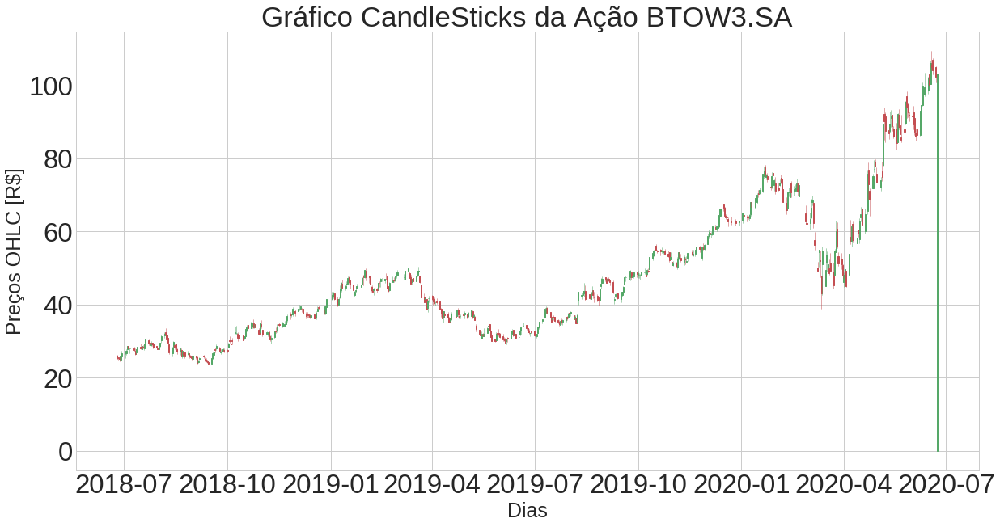

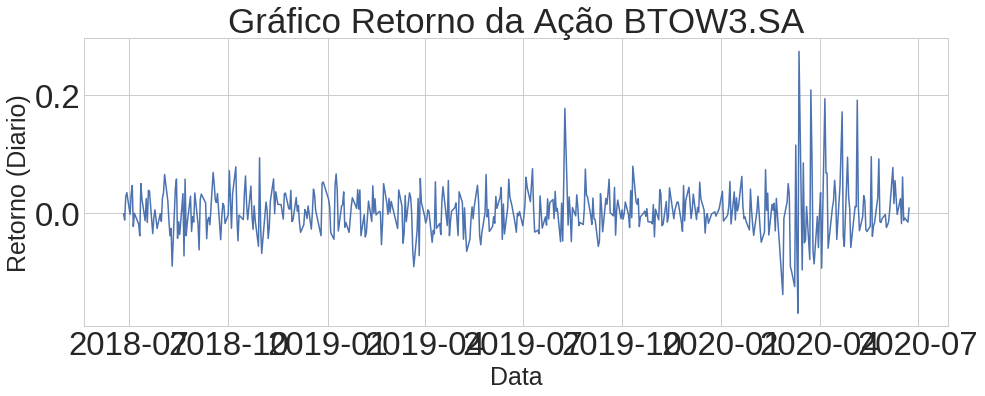

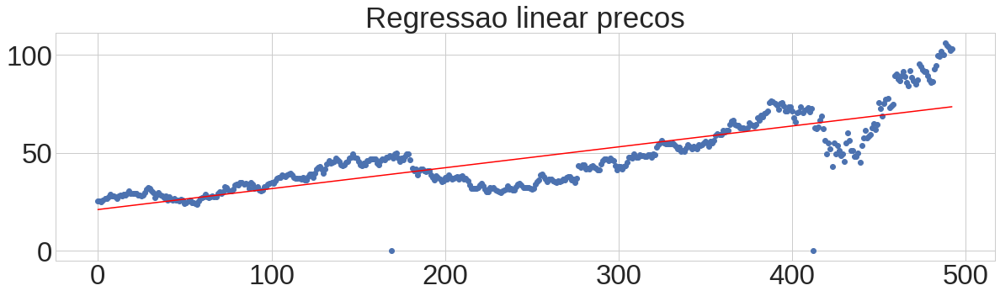

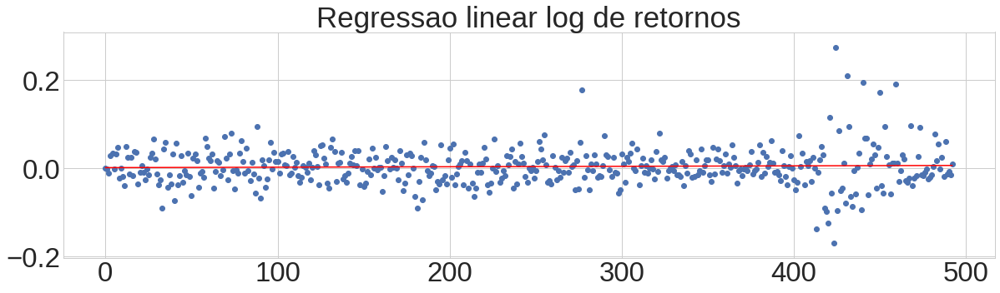


===========> BTOW3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  254
              Negative -  236
              Pct Up   - 51.84

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  256
              Negative -  236
              Pct Up   - 52.03


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.00

              R. price    : 20.95268
              Coef_price  : 0.10680986

              R. intercept: 0.00125
              Coef        : 0.00001008

              Target_sell : 109.72
              Actual_price: 103.30
              Target_buy  : 98.59

              Base_price  : 22.07






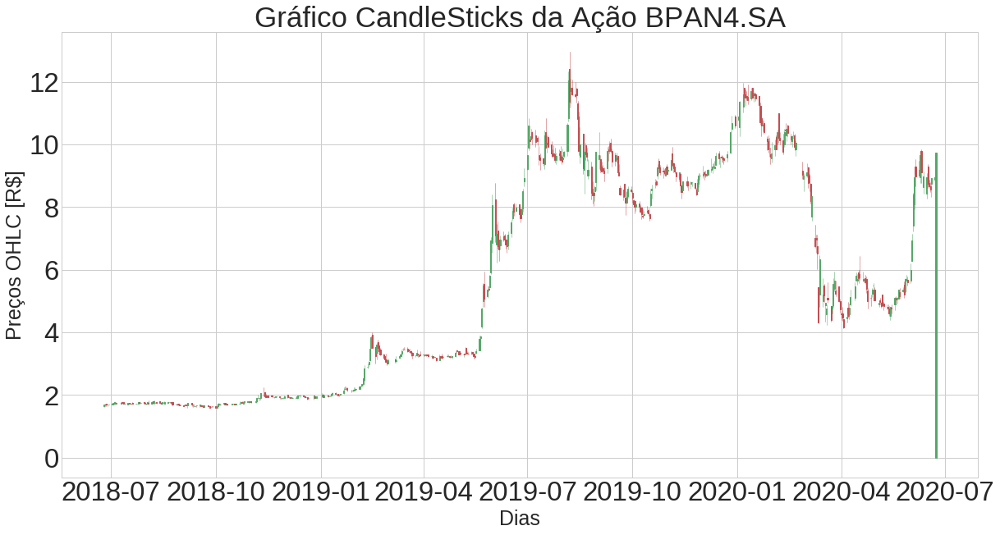

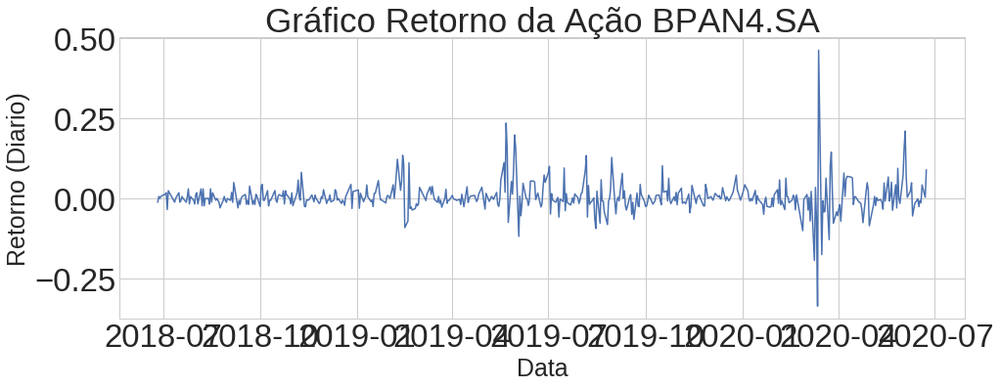

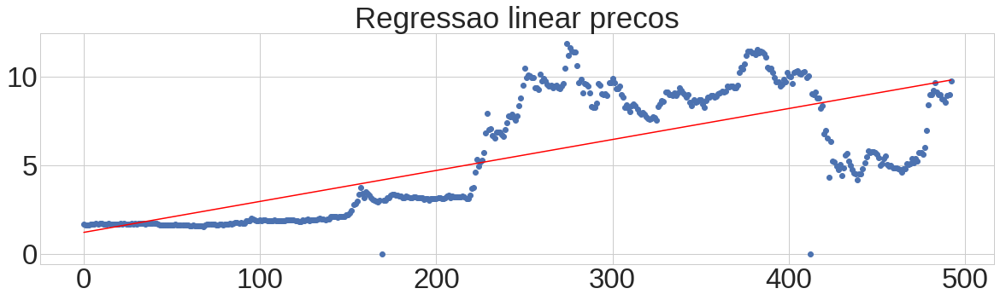

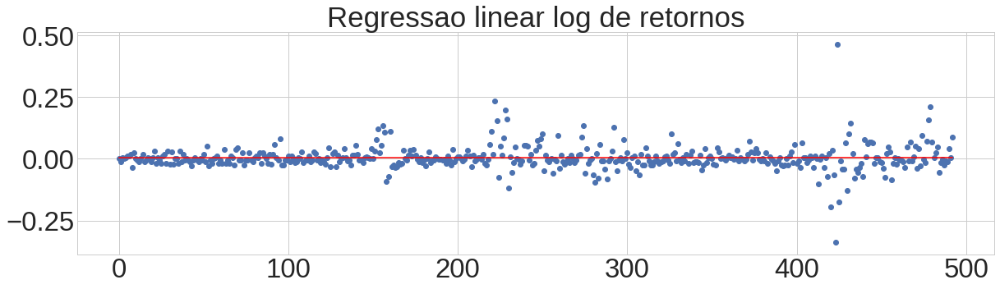


===========> BPAN4.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  246
              Negative -  244
              Pct Up   - 50.20

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  248
              Negative -  244
              Pct Up   - 50.41


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.01

              R. price    : 1.20471
              Coef_price  : 0.01745443

              R. intercept: 0.00452
              Coef        : 0.00000115

              Target_sell : 9.05
              Actual_price: 9.75
              Target_buy  : 8.89

              Base_price  : 1.22






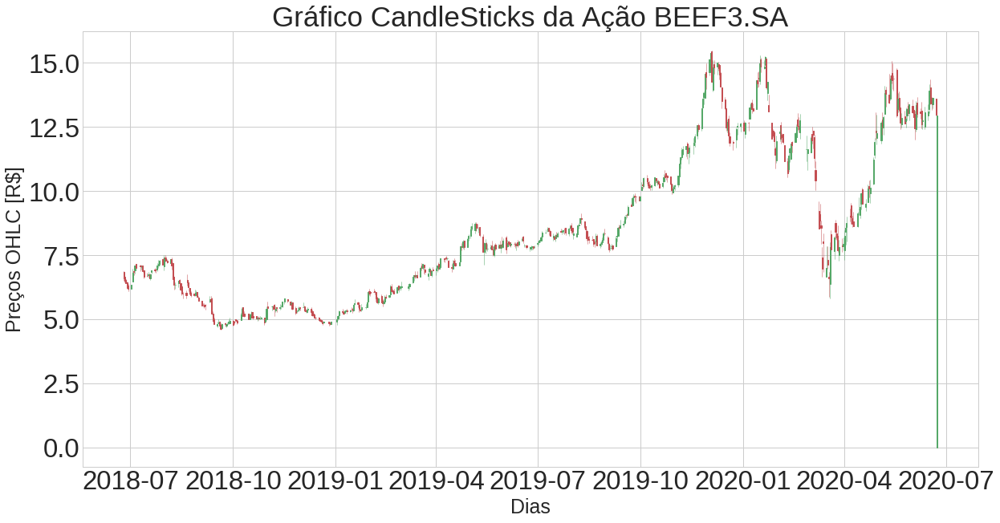

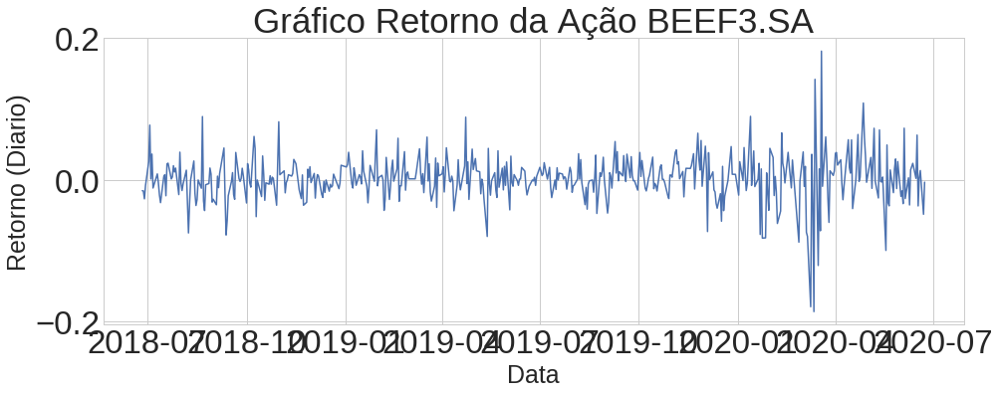

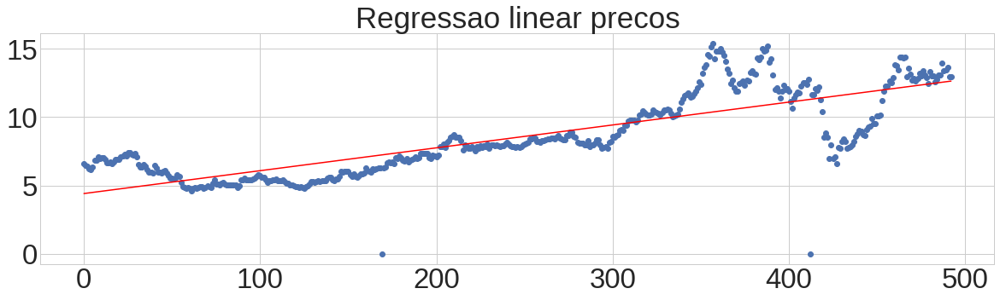

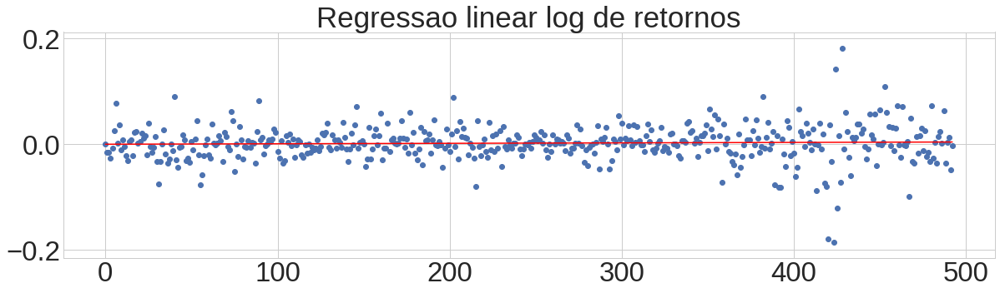


===========> BEEF3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  268
              Negative -  222
              Pct Up   - 54.69

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  270
              Negative -  222
              Pct Up   - 54.88


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.01

              R. price    : 4.40902
              Coef_price  : 0.01672748

              R. intercept: -0.00018
              Coef        : 0.00000856

              Target_sell : 13.40
              Actual_price: 12.94
              Target_buy  : 13.18

              Base_price  : 4.45






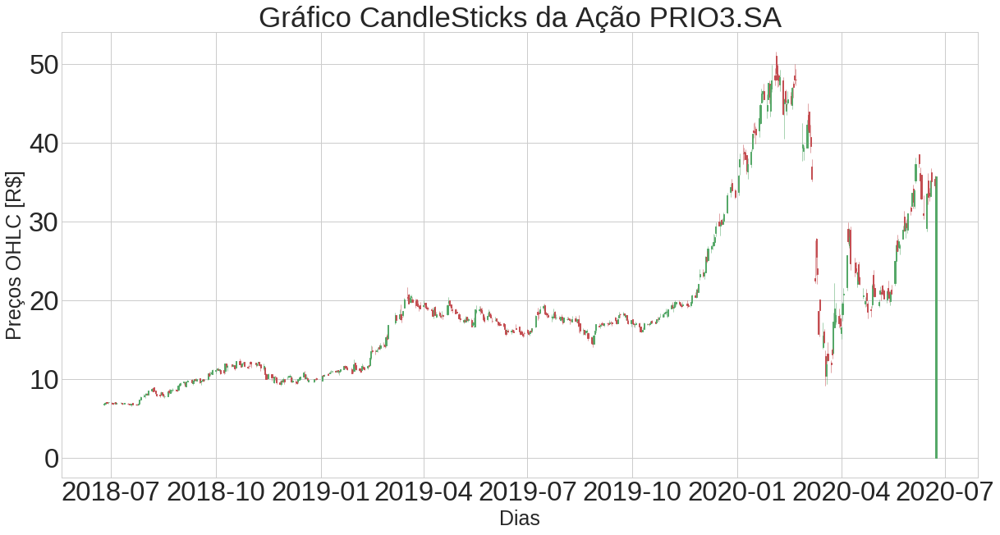

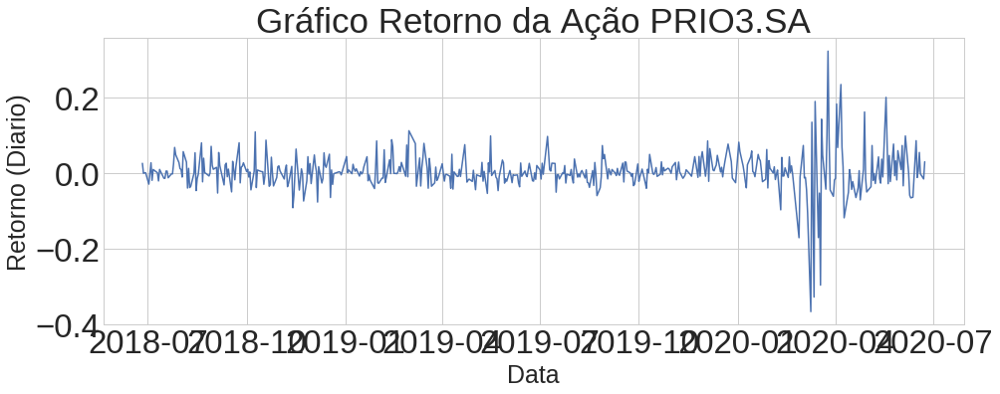

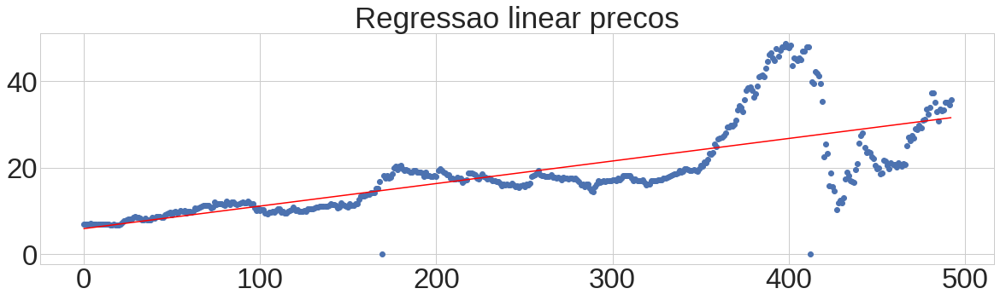

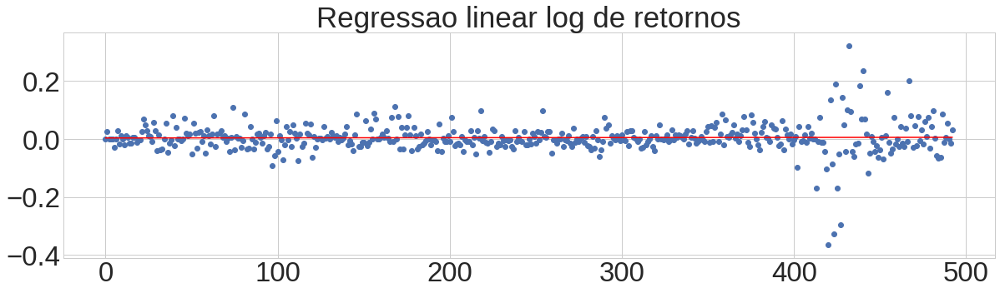


===========> PRIO3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  261
              Negative -  229
              Pct Up   - 53.27

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  263
              Negative -  229
              Pct Up   - 53.46


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.00

              R. price    : 5.85682
              Coef_price  : 0.05226319

              R. intercept: 0.00360
              Coef        : 0.00000461

              Target_sell : 35.68
              Actual_price: 35.66
              Target_buy  : 33.87

              Base_price  : 6.01






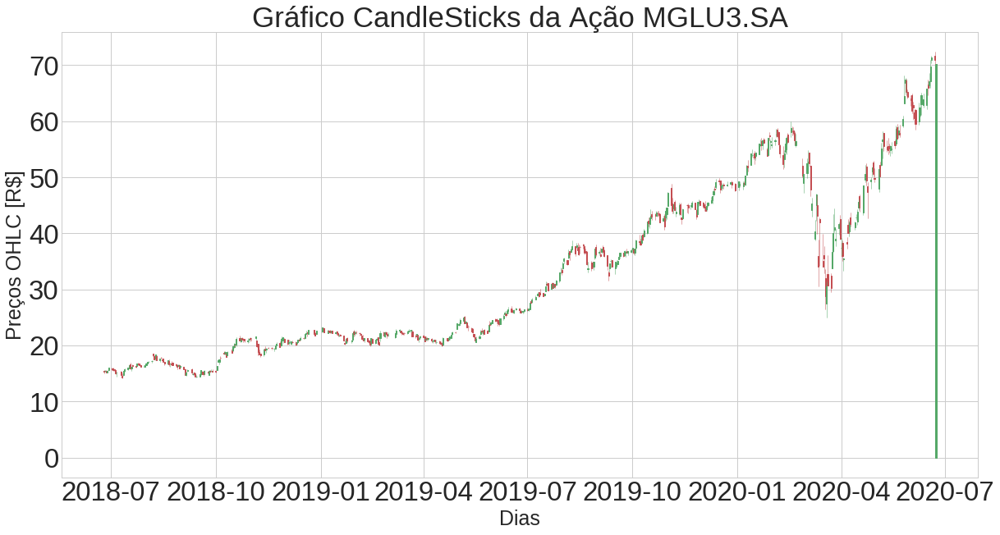

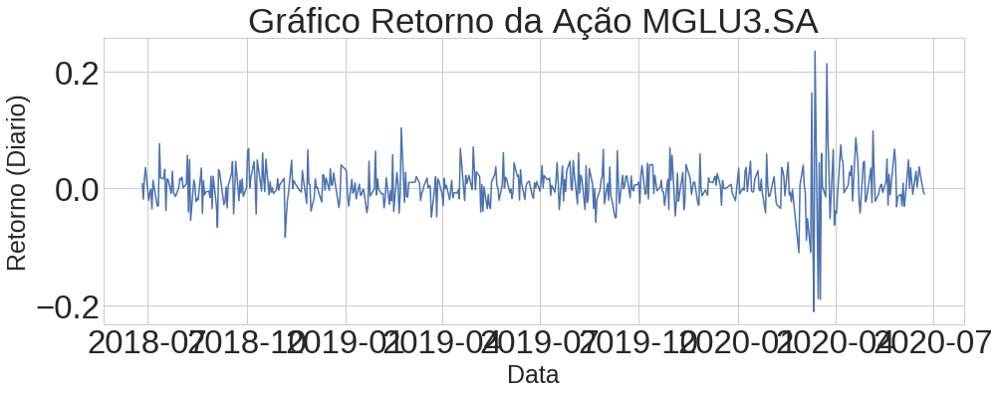

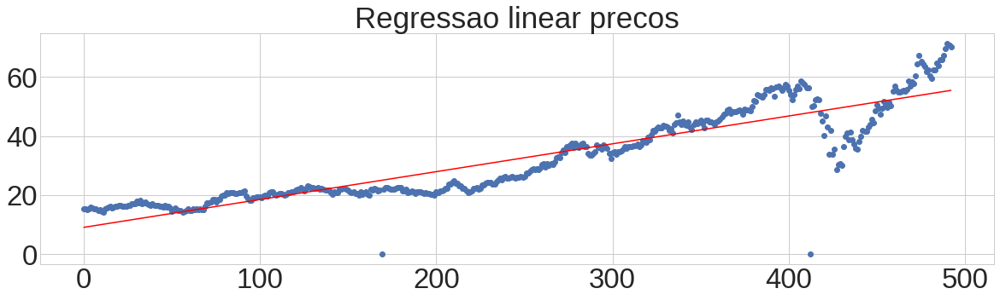

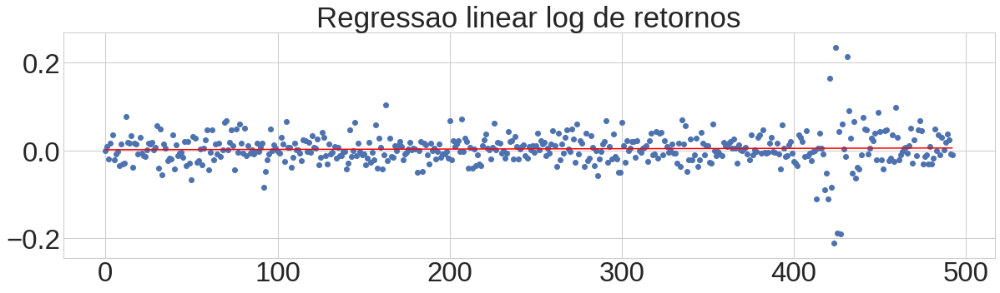


===========> MGLU3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  259
              Negative -  231
              Pct Up   - 52.86

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  261
              Negative -  231
              Pct Up   - 53.05


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.00

              R. price    : 9.01017
              Coef_price  : 0.09440975

              R. intercept: 0.00178
              Coef        : 0.00000819

              Target_sell : 73.19
              Actual_price: 70.25
              Target_buy  : 66.59

              Base_price  : 9.44






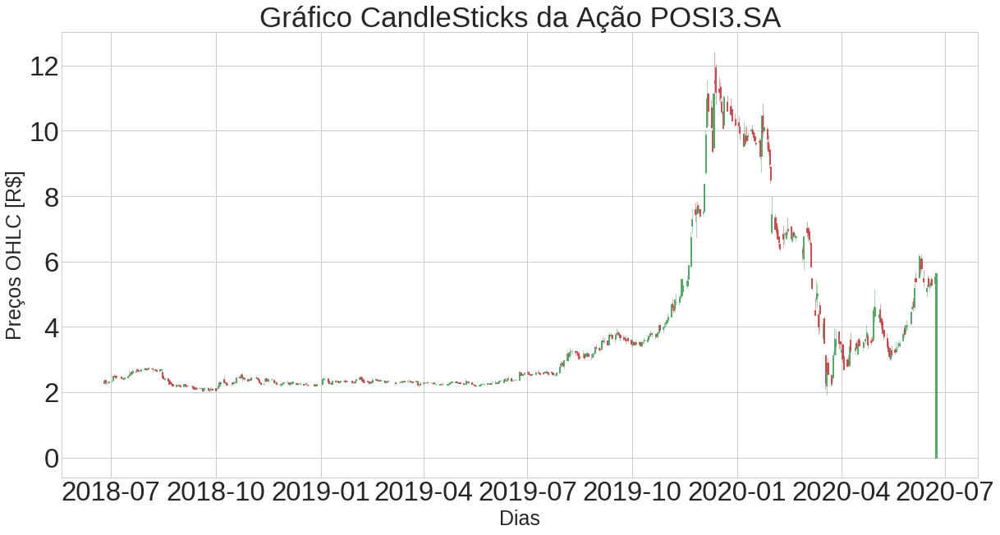

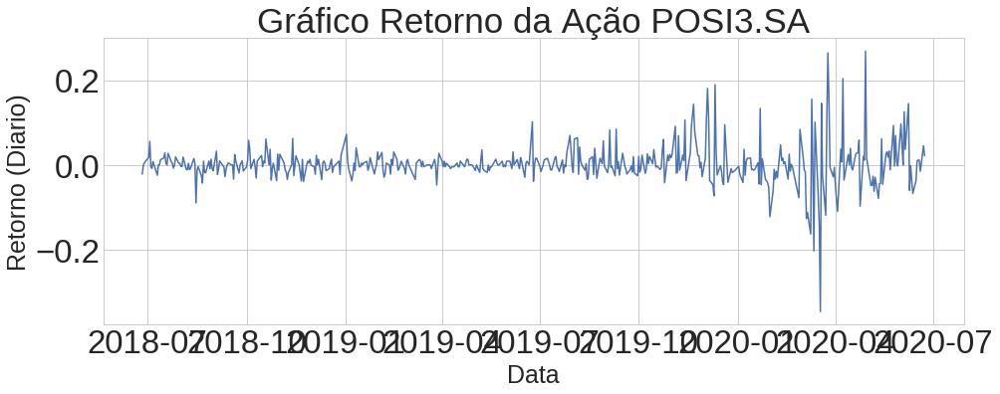

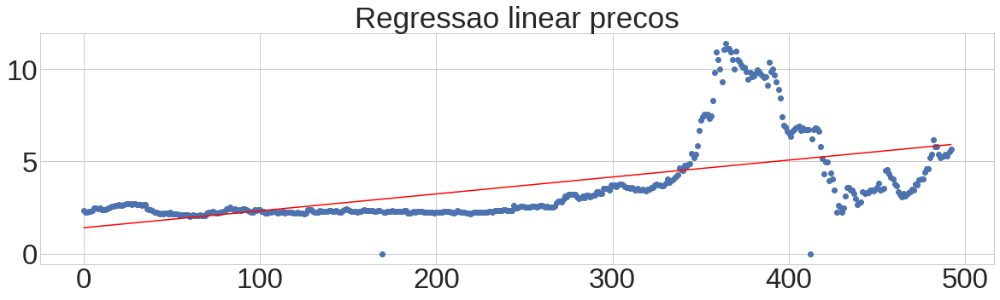

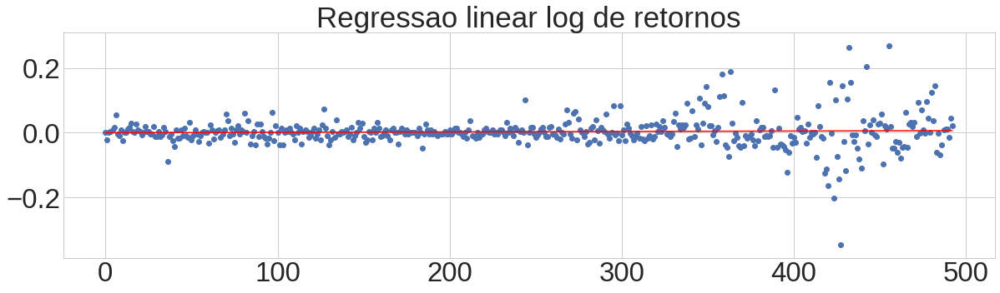


===========> POSI3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  265
              Negative -  225
              Pct Up   - 54.08

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  267
              Negative -  225
              Pct Up   - 54.27


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.01

              R. price    : 1.40974
              Coef_price  : 0.00916341

              R. intercept: -0.00035
              Coef        : 0.00001327

              Target_sell : 5.45
              Actual_price: 5.65
              Target_buy  : 5.41

              Base_price  : 1.42






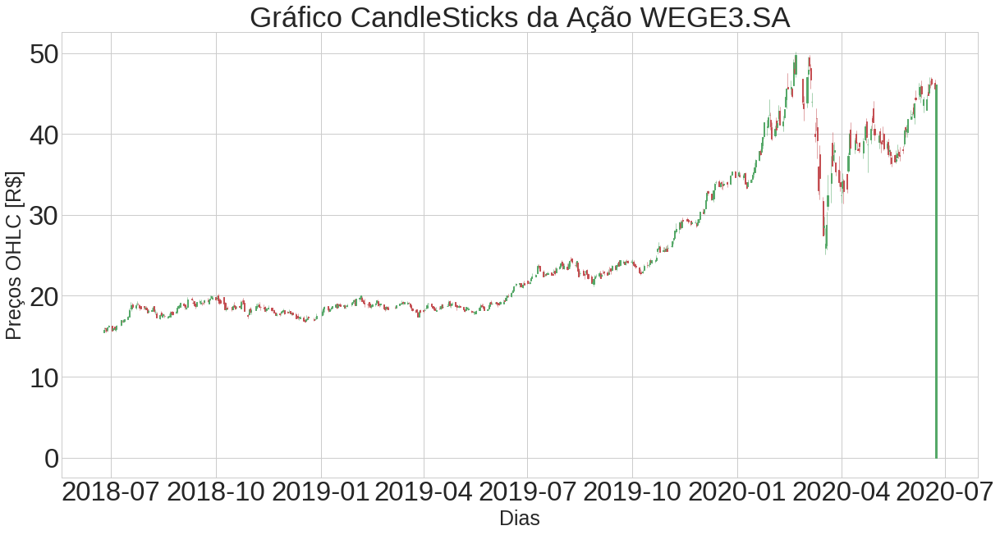

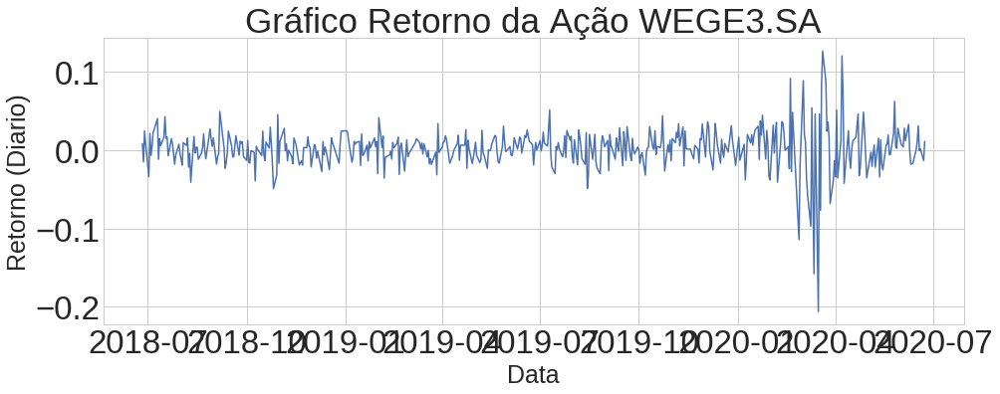

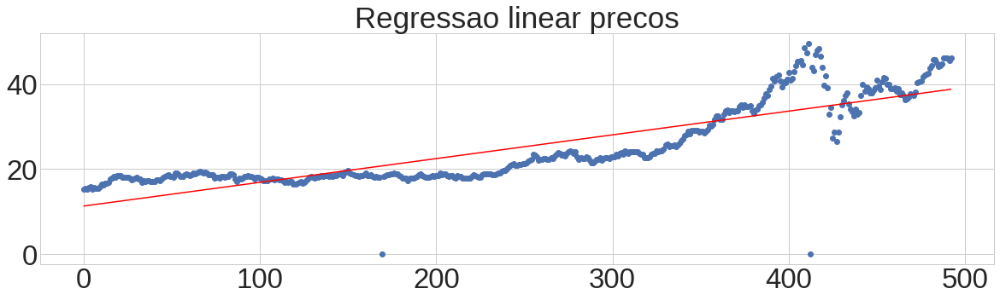

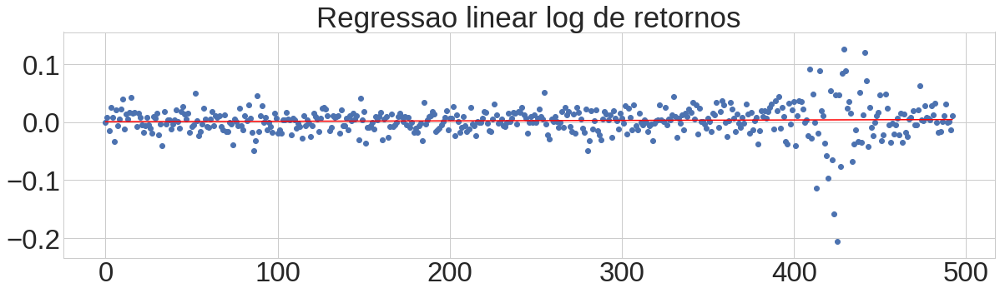


===========> WEGE3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  288
              Negative -  202
              Pct Up   - 58.78

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  290
              Negative -  202
              Pct Up   - 58.94


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.00

              R. price    : 11.27401
              Coef_price  : 0.05590125

              R. intercept: 0.00072
              Coef        : 0.00000763

              Target_sell : 47.33
              Actual_price: 46.12
              Target_buy  : 44.76

              Base_price  : 11.59






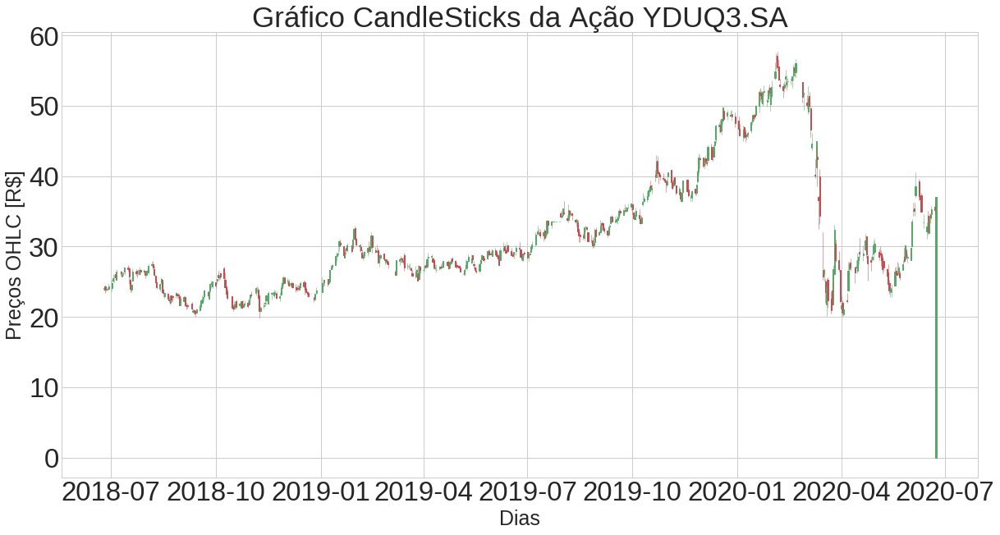

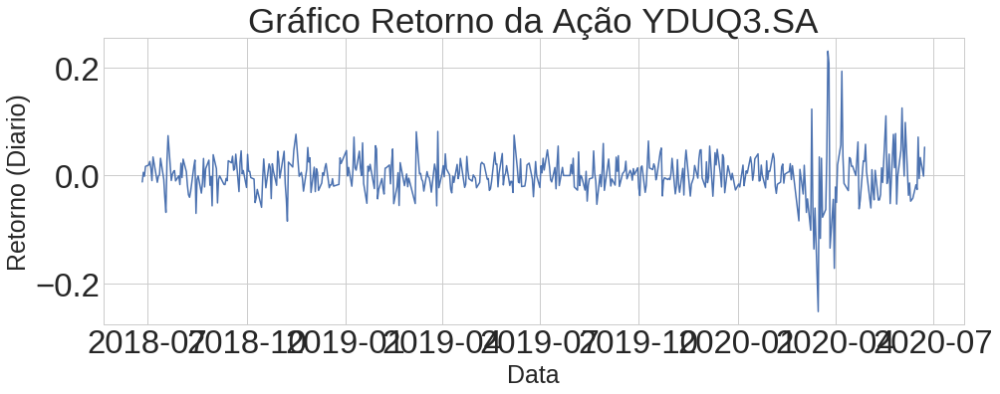

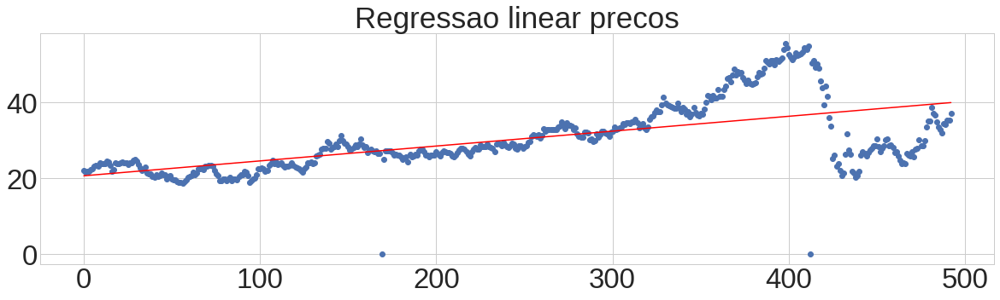

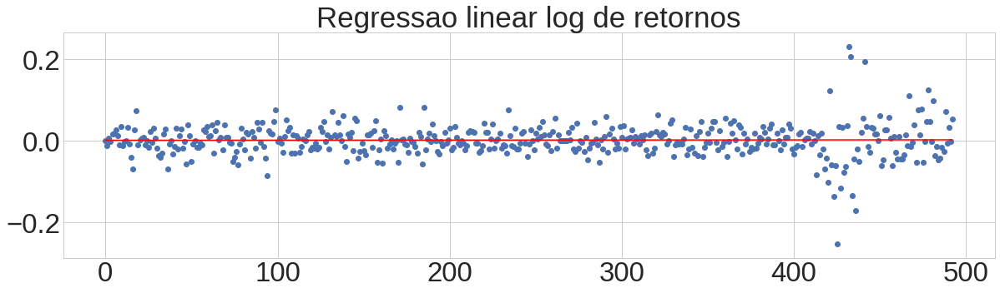


===========> YDUQ3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  254
              Negative -  236
              Pct Up   - 51.84

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  256
              Negative -  236
              Pct Up   - 52.03


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.00

              R. price    : 20.61041
              Coef_price  : 0.03926158

              R. intercept: 0.00128
              Coef        : 0.00000220

              Target_sell : 35.87
              Actual_price: 37.05
              Target_buy  : 34.49

              Base_price  : 21.02






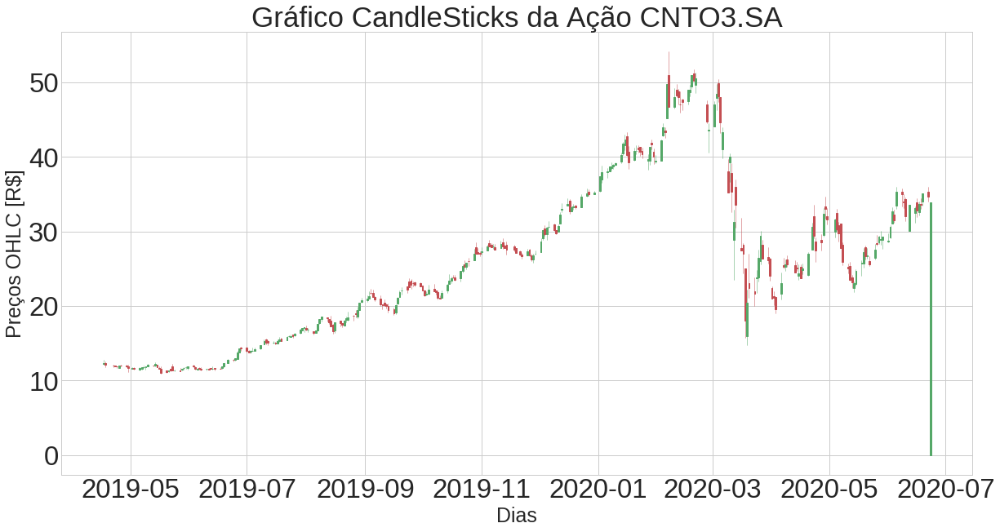

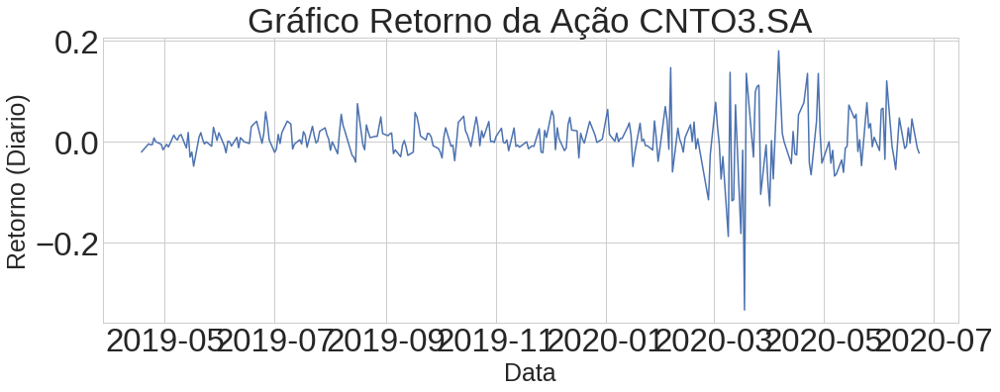

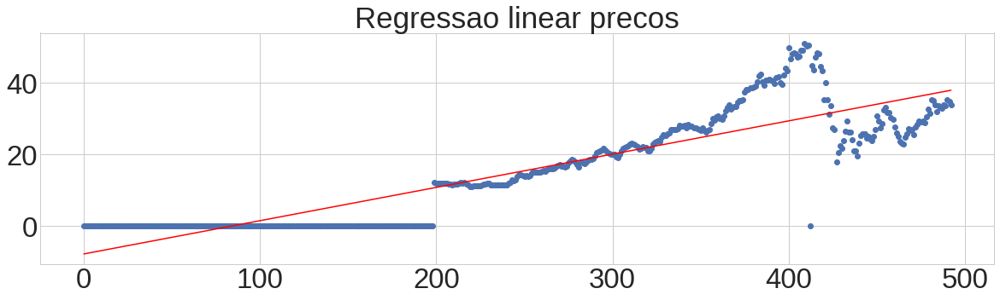

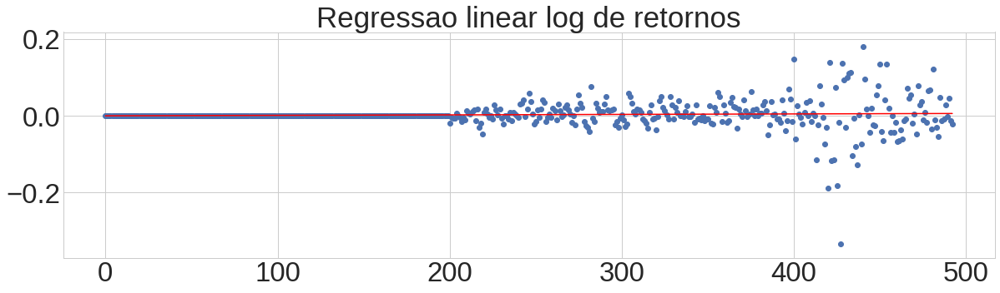


===========> CNTO3.SA

------------------------------------Daily Infos--------------------------------------
Count:
              Positive -  165
              Negative -  127
              Pct Up   - 56.51

-----------------------------------Monthly Infos-------------------------------------
Count:
              Positive -  166
              Negative -  127
              Pct Up   - 56.66


-----------------------------------Other Infos---------------------------------------
Count:
              Sharpe      : -0.00

              R. price    : -7.73330
              Coef_price  : 0.09269206

              R. intercept: -0.00023
              Coef        : 0.00001222

              Target_sell : 35.79
              Actual_price: 33.90
              Target_buy  : 32.61

              Base_price  : -8.09



In [110]:
index = stocks_all.index
# Calculo do indice Sharpe

ret_free_risk = 0.0225 #Considerando a Taxa Selic de 2018

# Sharpe = (Ret do Ativo - Ret livre de risco) / (Volatilidade do ativo)
def sharpe(ret_ativ, ret_free_risk, ativ_volatility):
    s = (ret_ativ - ret_free_risk)/ativ_volatility
    return s


finals_stocks = pd.DataFrame(index = best_names[:], columns = ['Reg_price','Coef_price','Reg_int','Coef_int'
                                                               ,'Sharpe','Base_price','Target_buy','Target_sell'])

for i in range(len(best_names)):
    
    df1 = pd.DataFrame(index=index)
    df1['Open']=stocks_all['Open'][best_names[i]]
    df1['High']=stocks_all['High'][best_names[i]]
    df1['Low']=stocks_all['Low'][best_names[i]]
    df1['Close']=stocks_all['Close'][best_names[i]]
    df1['Volume']=stocks_all['Volume'][best_names[i]]
    
    df1.reset_index(inplace=True)
    df1['Date'] = df1['Date'].map(mdates.date2num)
    
    
                #PRIMEIRO PLOT
    
    fig = plt.subplots(figsize=(20,10))
    plt.style.use('seaborn-whitegrid')
    ax1 = plt.subplot(111)
    candlestick_ohlc(ax1, df1.values, width=0.8, colorup='g', colordown='r',alpha=1)
    ax1.set_xlabel("Dias",fontsize=25)
    ax1.set_ylabel('Preços OHLC [R$]',fontsize=25)
    ax1.set_title('Gráfico CandleSticks da Ação '+best_names[i],fontsize=35) 
    ax1.xaxis_date()
    
    df1 = None
    
    print()
    print()
    print()
    
    
    
        # Calculando retornos diarios e mensais dos ativos

    stocks_all['Adj Close'][best_names[i]]
    ativ_daily_returns = stocks_all['Adj Close'][best_names[i]].dropna().pct_change().dropna()
    ativ_monthly_returns = stocks_all['Adj Close'][best_names[i]].pct_change().dropna()
    daily_values = ativ_daily_returns.copy()
    monthly_values = ativ_monthly_returns.copy()
    
    
    pos_days = len(daily_values[daily_values >= 0])
    neg_days = len(daily_values[daily_values < 0])
    
    pos_months = len(monthly_values[monthly_values >= 0])
    neg_months = len(monthly_values[monthly_values < 0])
    

    ibov_year_returns = ibov['Adj Close'].dropna().dropna().pct_change().dropna().resample('Y').mean()
    ibov_mean = ibov['Adj Close'].dropna().mean()
    ibov_std = ibov['Adj Close'].dropna().std()
    ibov_year_volatility = (ibov_mean/ibov_std)


    # Ativo
    ativ_year_returns = stocks_all['Adj Close'][best_names[i]].dropna().pct_change().dropna().resample('Y').mean()
    ativ_mean = stocks_all['Adj Close'][best_names[i]].dropna().mean()
    ativ_std = stocks_all['Adj Close'][best_names[i]].dropna().std()

    # Calculando
    sharp = sharpe(ativ_year_returns, ret_free_risk, ativ_std)
    
            # SEGUNDO PLOT

    fig = plt.figure(figsize = (15,5))
    ax1 = fig.add_axes([0.1,0.1,0.8,0.8])
    ax1.plot(ativ_daily_returns)
    ax1.set_xlabel("Data", fontsize = 25)
    ax1.set_ylabel("Retorno (Diario)", fontsize = 25)
    ax1.set_title('Gráfico Retorno da Ação '+best_names[i],fontsize=35) 
    plt.show()    
    
            # TERCEIRO PLOT
    
    log_stocks = stocks_all['Adj Close'][best_names[i]]    # Y
    stocks_index = log_stocks.index                                 #Date
    
    counter = None
    x = None
    y = None

    y = log_stocks.fillna(0)
    counter = np.arange(len(y))
    x = counter[:]
    
    correlacao = np.corrcoef(x,y)
    
    x = x.reshape(-1,1)
    
    regressor = LinearRegression()
    regressor.fit(x,y)
    regressor.coef_
    reg_price = regressor.intercept_
    coef_price = regressor.coef_[0]
    
    base_price_1 = reg_price * (1 + coef_price)
    target_buy_1 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1-coef_price)
    target_sell_1 = stocks_all['Adj Close'][best_names[i]].iloc[-5:].mean() * (1+coef_price)
    
    fig = plt.figure(figsize = (20,5))
    plt.scatter(x,y)
    plt.plot(x, regressor.predict(x), color = 'red')
    plt.title('Regressao linear precos', fontsize=35)
    plt.show()
    
        
            # QUARTO PLOT
        
    log_stocks =  stocks_all['Adj Close'][best_names[i]].pct_change() # Y
    stocks_index = log_stocks.index
    
    counter = None
    x = None
    y = None

    y = log_stocks.fillna(0)
    counter = np.arange(len(y))
    x = counter[:]
        
    correlacao = np.corrcoef(x,y)
    
    x = x.reshape(-1,1)
    
    regressor = LinearRegression()
    regressor.fit(x,y)
    regressor.coef_
    reg_int = regressor.intercept_
    coef_int = regressor.coef_[0]
    
    base_price_2 = reg_price * (1 + coef_int)
    target_buy_2 = stocks_close[best_names[i]].iloc[-5:].mean() * (1-coef_int)
    target_sell_2 = stocks_close[best_names[i]].iloc[-5:].mean() * (1+coef_int)
    
    base_price = (base_price_1 + base_price_2) / 2
    target_buy = (target_buy_1 + target_buy_2) / 2
    target_sell = (target_sell_1 + target_sell_2) / 2
    
    fig = plt.figure(figsize = (20,5))
    plt.scatter(x,y)
    plt.plot(x, regressor.predict(x), color = 'red')
    plt.title('Regressao linear log de retornos', fontsize=35)
    plt.show()
    
    
    
    
    finals_stocks['Reg_price'][best_names[i]] = reg_price
    finals_stocks['Coef_price'][best_names[i]] = coef_price
    finals_stocks['Reg_int'][best_names[i]] = reg_int
    finals_stocks['Coef_int'][best_names[i]] = coef_int
    finals_stocks['Sharpe'][best_names[i]] = sharp
    finals_stocks['Base_price'][best_names[i]] = base_price
    finals_stocks['Target_buy'][best_names[i]] = target_buy
    finals_stocks['Target_sell'][best_names[i]] = target_sell
    
    
    print("\n===========>",best_names[i])
    print()
    print("------------------------------------Daily Infos--------------------------------------")
    print("Count:")
    print("              Positive - ",pos_days)
    print("              Negative - ",neg_days)
    print("              Pct Up   - %.2f" % (100*pos_days/(pos_days+neg_days)))
    print()
    print("-----------------------------------Monthly Infos-------------------------------------")
    print("Count:")
    print("              Positive - ",pos_months)
    print("              Negative - ",neg_months)
    print("              Pct Up   - %.2f" % (100*pos_months/(pos_months+neg_months)))
    print()
    print()
    print("-----------------------------------Other Infos---------------------------------------")
    print("Count:")
    print("              Sharpe      : %.2f" % sharp.mean().reshape(1, -1))
    print()
    print("              R. price    : %.5f" % reg_price)
    print("              Coef_price  : %.8f" % coef_price)
    print()
    print("              R. intercept: %.5f" % reg_int)
    print("              Coef        : %.8f" % coef_int)
    print()
    print("              Target_sell : %.2f" % target_sell)
    print("              Actual_price: %.2f" % stocks_close[best_names[i]].iloc[-1])
    print("              Target_buy  : %.2f" % target_buy)
    print()
    print("              Base_price  : %.2f" % base_price)
    print()
    
    

In [111]:
final_names = best_names
#final_names = good_stocks 
#final_names = best_corr


# Define o peridodo a ser analisado

today = dt.date.today()
E_Day = today.day; E_Month = today.month; E_Year = today.year
day_before = today - dt.timedelta(n_months)
S_Day = day_before.day; S_Month = day_before.month; S_Year = day_before.year


# Analise dos 5 ativos filtrados

stocks_all=yahoo(final_names[:],S_Day, S_Month, S_Year, E_Day, E_Month, E_Year)
stocks_all.tail()

[*********************100%***********************]  10 of 10 downloaded


Adj Close                                                        \
            BEEF3.SA BPAN4.SA BTOW3.SA CNTO3.SA MGLU3.SA POSI3.SA PRIO3.SA   
Date                                                                         
2020-06-17     13.42     8.67   106.20    33.70    67.19     5.31    33.33   
2020-06-18     13.46     8.56   104.88    33.60    69.70     5.37    35.17   
2020-06-19     13.64     8.92   104.00    35.12    71.40     5.29    35.12   
2020-06-22     12.98     8.95   102.40    34.68    70.90     5.53    34.60   
2020-06-23     12.94     9.75   103.30    33.90    70.25     5.65    35.66   

                                       ...      Volume                        \
           SAPR4.SA WEGE3.SA YDUQ3.SA  ...    BEEF3.SA   BPAN4.SA   BTOW3.SA   
Date                                   ...                                     
2020-06-17     6.25    46.16    34.29  ...  13315200.0  3736700.0  4704400.0   
2020-06-18     6.26    46.13    34.10  ...   8972900.0  5259200.0  2974100.0   
2020-06-19     6.50    46.21    35.24  ...  12948500.0  9706100.0  3827300.0   
2020-06-22     6.53    45.60    35.20  ...   9356500.0  6297100.0  2328700.0   
2020-06-23     6.49    46.12    37.05  ...         0.0        0.0        0.0   

                                                                               \
             CNTO3.SA    MGLU3.SA   POSI3.SA   PRIO3.SA   SAPR4.SA   WEGE3.SA   
Date                                                                            
2020-06-17  1934300.0  19341900.0  5058900.0  2419300.0  2853800.0  4744600.0   
2020-06-18  2070300.0  19522200.0  4457200.0  3589400.0  2268900.0  2622600.0   
2020-06-19  2489900.0  20071500.0  5787400.0  4697800.0  3896300.0  8316600.0   
2020-06-22  1699900.0   9359400.0  7415500.0  2002700.0  4666700.0  2975200.0   
2020-06-23        0.0         0.0        0.0        0.0        0.0        0.0   

                       
             YDUQ3.SA  
Date                   
2020-06-17  3785500.0  
2020-06-18  3249900.0  
2020-06-19  4672000.0  
2020-06-22  3710900.0  
2020-06-23        0.0  

[5 rows x 60 columns]

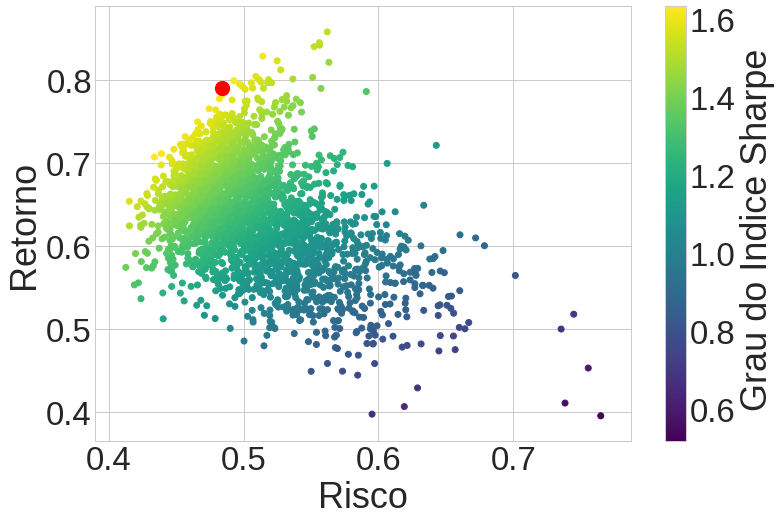

In [113]:
import random

# Markowits

stocks = stocks_all['Adj Close']
log_ret = np.log(stocks / stocks.shift(1))

# Admite que a mesma sequencia randomica
np.random.seed(42)
num_ports = 2500
all_weights = np.zeros((num_ports, len(stocks.columns)))
ret_arr = np.zeros(num_ports)
vol_arr = np.zeros(num_ports)
sharpe_arr = np.zeros(num_ports)

for x in range(num_ports):
    # Weights
    weights = np.array(np.random.random(len(final_names)))
    weights = weights/np.sum(weights)
    
    # Save weights
    all_weights[x,:] = weights
    
    # Expected return
    ret_arr[x] = np.sum( (log_ret.mean() * weights * 252))
    
    # Expected volatility
    vol_arr[x] = np.sqrt(np.dot(weights.T, np.dot(log_ret.cov()*252, weights)))
    
    # Sharpe Ratio
    sharpe_arr[x] = ret_arr[x]/vol_arr[x]
   
        # Para operar na venda utilize o agrmin()
maximo = sharpe_arr.argmax()
#maximo = sharpe_arr.argmin()

max_sr_ret = ret_arr[maximo]
max_sr_vol = vol_arr[maximo]

plt.figure(figsize=(12,8))
plt.scatter(vol_arr, ret_arr, c=sharpe_arr, cmap='viridis')
plt.colorbar(label='Grau do Indice Sharpe ')
plt.xlabel('Risco')
plt.ylabel('Retorno')
plt.scatter(max_sr_vol, max_sr_ret,c='red', s=200) # red dot
plt.show()

In [114]:
num_ports

2500

In [115]:
# Fator expectativa
exp = (max_sr_ret - max_sr_vol)/(max_sr_ret + max_sr_vol)

expec_real = 1 + (exp/1000)

exp = expec_real**252

exp

1.0624428993126578

In [117]:
# Simulacao de compra
money = 10000
last_price = stocks[-1:].iloc[0]

for i in range(len(final_names)):
    stocks_qtd = money * all_weights[maximo][i]
    stocks_qtd = stocks_qtd / last_price[i]
    
    
    print("##=========="+stocks.iloc[i].index[i]+"==========##")
    print()
    print(all_weights[maximo][i])
    print()
    print("Numero de acoes a serem compradas: %.1f" % stocks_qtd)
    print()
    print("Valor total:    R$ %.2f" % (stocks_qtd*last_price[i]))
    print()

##==========BEEF3.SA==========##

0.05440471611674473

Numero de acoes a serem compradas: 42.0

Valor total:    R$ 544.05

##==========BPAN4.SA==========##

0.11620469631934699

Numero de acoes a serem compradas: 119.2

Valor total:    R$ 1162.05

##==========BTOW3.SA==========##

0.19601537766219265

Numero de acoes a serem compradas: 19.0

Valor total:    R$ 1960.15

##==========CNTO3.SA==========##

0.1779051910957486

Numero de acoes a serem compradas: 52.5

Valor total:    R$ 1779.05

##==========MGLU3.SA==========##

0.17798184916926704

Numero de acoes a serem compradas: 25.3

Valor total:    R$ 1779.82

##==========POSI3.SA==========##

0.03577522886307056

Numero de acoes a serem compradas: 63.3

Valor total:    R$ 357.75

##==========PRIO3.SA==========##

0.05382674513150346

Numero de acoes a serem compradas: 15.1

Valor total:    R$ 538.27

##==========SAPR4.SA==========##

0.01552243085057998

Numero de acoes a serem compradas: 23.9

Valor total:    R$ 155.22

##==========

In [ ]:
my_port = ['BIDI4.SA','BTOW3.SA','CNTO3.SA','CSNA3.SA','FLMA11.SA','GGBR4.SA','ITSA4.SA','IVVB11.SA'
           ,'JHSF3.SA','LCAM3.SA','MGLU3.SA','SHUL4.SA','SLCE3.SA','SQIA3.SA','SUZB3.SA','TOTS3.SA'
           ,'WEGE3.SA']
best_names = my_port